In [91]:
from IPython.display import display
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import shutil
import posixpath
from sklearn.preprocessing import StandardScaler
import wfdb

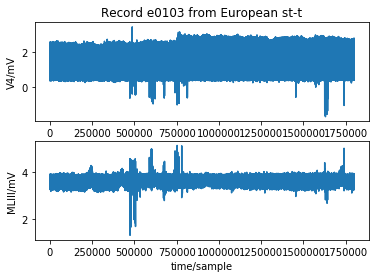

{'record_name': 'e0103',
 'n_sig': 2,
 'fs': 250,
 'counter_freq': None,
 'base_counter': None,
 'sig_len': 1800000,
 'base_time': None,
 'base_date': None,
 'comments': ['Age: 62  Sex: M',
  'Mixed angina',
  '1-vessel disease (RCA)',
  'Medications: nitrates, diltiazem',
  'Recorder type: ICR 7200'],
 'sig_name': ['V4', 'MLIII'],
 'p_signal': array([[0.455, 3.755],
        [0.46 , 3.78 ],
        [0.45 , 3.765],
        ...,
        [0.535, 3.91 ],
        [0.54 , 3.87 ],
        [0.53 , 3.865]]),
 'd_signal': None,
 'e_p_signal': None,
 'e_d_signal': None,
 'file_name': ['e0103.dat', 'e0103.dat'],
 'fmt': ['212', '212'],
 'samps_per_frame': [1, 1],
 'skew': [None, None],
 'byte_offset': [None, None],
 'adc_gain': [200.0, 200.0],
 'baseline': [0, 0],
 'units': ['mV', 'mV'],
 'adc_res': [12, 12],
 'adc_zero': [0, 0],
 'init_value': [91, 751],
 'checksum': [56457, 48959],
 'block_size': [0, 0]}

In [92]:
record = wfdb.rdrecord('european-st-t-database/e0103') 
wfdb.plot_wfdb(record=record, title='Record e0103 from European st-t') 
display(record.__dict__)

In [93]:
import numpy as np
arr1=np.array(record.p_signal[:])
x, y = arr1.T
np.where(x == max(x))[0][0]
max(x)
x=np.array([y for y in x])
x=x.reshape(-1, 1)

In [94]:
print(x[:50])

[[0.455]
 [0.46 ]
 [0.45 ]
 [0.425]
 [0.435]
 [0.455]
 [0.49 ]
 [0.5  ]
 [0.485]
 [0.5  ]
 [0.495]
 [0.5  ]
 [0.5  ]
 [0.515]
 [0.53 ]
 [0.56 ]
 [0.57 ]
 [0.56 ]
 [0.535]
 [0.535]
 [0.535]
 [0.525]
 [0.51 ]
 [0.5  ]
 [0.5  ]
 [0.49 ]
 [0.485]
 [0.465]
 [0.46 ]
 [0.45 ]
 [0.445]
 [0.44 ]
 [0.435]
 [0.44 ]
 [0.445]
 [0.475]
 [0.495]
 [0.5  ]
 [0.5  ]
 [0.48 ]
 [0.45 ]
 [0.43 ]
 [0.43 ]
 [0.445]
 [0.495]
 [0.63 ]
 [0.88 ]
 [1.29 ]
 [1.77 ]
 [2.19 ]]


scaler=StandardScaler((0,1))
scaler.fit(x)
arr2=scaler.transform(x)

In [95]:
print(x[:100])

[[0.455]
 [0.46 ]
 [0.45 ]
 [0.425]
 [0.435]
 [0.455]
 [0.49 ]
 [0.5  ]
 [0.485]
 [0.5  ]
 [0.495]
 [0.5  ]
 [0.5  ]
 [0.515]
 [0.53 ]
 [0.56 ]
 [0.57 ]
 [0.56 ]
 [0.535]
 [0.535]
 [0.535]
 [0.525]
 [0.51 ]
 [0.5  ]
 [0.5  ]
 [0.49 ]
 [0.485]
 [0.465]
 [0.46 ]
 [0.45 ]
 [0.445]
 [0.44 ]
 [0.435]
 [0.44 ]
 [0.445]
 [0.475]
 [0.495]
 [0.5  ]
 [0.5  ]
 [0.48 ]
 [0.45 ]
 [0.43 ]
 [0.43 ]
 [0.445]
 [0.495]
 [0.63 ]
 [0.88 ]
 [1.29 ]
 [1.77 ]
 [2.19 ]
 [2.415]
 [2.32 ]
 [1.985]
 [1.535]
 [1.085]
 [0.75 ]
 [0.58 ]
 [0.52 ]
 [0.525]
 [0.525]
 [0.515]
 [0.49 ]
 [0.475]
 [0.465]
 [0.45 ]
 [0.455]
 [0.455]
 [0.465]
 [0.48 ]
 [0.475]
 [0.49 ]
 [0.475]
 [0.455]
 [0.46 ]
 [0.465]
 [0.475]
 [0.475]
 [0.46 ]
 [0.485]
 [0.485]
 [0.485]
 [0.485]
 [0.495]
 [0.495]
 [0.495]
 [0.495]
 [0.495]
 [0.49 ]
 [0.485]
 [0.5  ]
 [0.515]
 [0.53 ]
 [0.515]
 [0.54 ]
 [0.555]
 [0.57 ]
 [0.58 ]
 [0.595]
 [0.575]
 [0.585]]


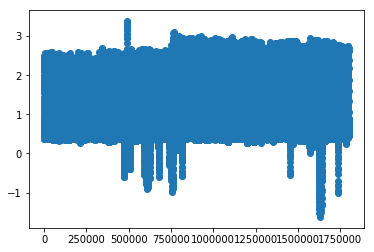

In [96]:
from matplotlib import pyplot as plt
ts=[y for y in range(1800000)]
plt.scatter(ts,x)
plt.show()

In [97]:
np.nanmean(x)

0.5674073138888887

In [98]:
np.nanstd(x)

0.29070102108400797

In [99]:

r_point_array = []
start_index = 0

while (start_index < 1800000):
    if start_index == 0:
        ts=np.array([u+1 for u in range(200)])
        sample=x[:200]
        r_point_y=max(sample)
        point=np.where(sample == max(sample))[0][0]
        r_point_x=ts[point]
        #print(r_point_y)
        r_point_array+=[r_point_x]
        # next we find the slope made by the line connecting to the s point
        start_index=int(r_point_y)+40
    else:
        ts=np.array([u+1 for u in range(200)])
        
        sample=sample.reshape(1,-1)[0]
        next_i=0
        #print(sample)
        if (start_index+next_i)<1800000:
            while (start_index+next_i)<1800000 and x[start_index+next_i]<0.24:
                next_i+=1
            while (start_index+next_i)<1800000 and x[next_i]<x[next_i+1]:
                next_i+=1
            r_point_array+=[start_index+next_i] 
        # next we find the slope made by the line connecting to the s point
        start_index=start_index+next_i+40
print(r_point_array)
    

[51, 43, 84, 125, 166, 207, 248, 289, 330, 371, 412, 453, 494, 535, 576, 617, 658, 699, 740, 781, 822, 863, 904, 945, 986, 1027, 1068, 1109, 1150, 1191, 1232, 1273, 1314, 1355, 1396, 1437, 1478, 1519, 1560, 1601, 1642, 1683, 1724, 1765, 1806, 1847, 1888, 1929, 1970, 2011, 2052, 2093, 2134, 2175, 2216, 2257, 2298, 2339, 2380, 2421, 2462, 2503, 2544, 2585, 2626, 2667, 2708, 2749, 2790, 2831, 2872, 2913, 2954, 2995, 3036, 3077, 3118, 3159, 3200, 3241, 3282, 3323, 3364, 3405, 3446, 3487, 3528, 3569, 3610, 3651, 3692, 3733, 3774, 3815, 3856, 3897, 3938, 3979, 4020, 4061, 4102, 4143, 4184, 4225, 4266, 4307, 4348, 4389, 4430, 4471, 4512, 4553, 4594, 4635, 4676, 4717, 4758, 4799, 4840, 4881, 4922, 4963, 5004, 5045, 5086, 5127, 5168, 5209, 5250, 5291, 5332, 5373, 5414, 5455, 5496, 5537, 5578, 5619, 5660, 5701, 5742, 5783, 5824, 5865, 5906, 5947, 5988, 6029, 6070, 6111, 6152, 6193, 6234, 6275, 6316, 6357, 6398, 6439, 6480, 6521, 6562, 6603, 6644, 6685, 6726, 6767, 6808, 6849, 6890, 6931, 6972, 7

In [100]:
qrs_angle_list=[]
import math
for r_point_x in r_point_array:
    r_point_y=x[r_point_x]
    # next we find the slope made by the line connecting to the s point
    d=50
    if r_point_x+50>1800000:
        d=1800000-r_point_x
    for j in range(r_point_x,r_point_x+d):
        if x[j]<x[j+1]:
            break
    for k in range(r_point_x,r_point_x-50,-1):
        if x[k-1]>x[k]:
            break
    q_point_y=x[k]
    q_point_x=k
    s_point_y=x[j]
    s_point_x=j
    print(q_point_x,q_point_y,r_point_x,r_point_y,s_point_x,s_point_y)
    rs_slope=((s_point_y-r_point_y)/(s_point_x-r_point_x))
    qr_slope=((r_point_y-q_point_y)/(r_point_x-q_point_x))
    print("QR slope:",qr_slope,", RS slope:",rs_slope)
    print(" now finding angl made by the lines on the top")
    print("QR angle:",math.degrees(math.atan(qr_slope)),"RS angle:",math.degrees(math.atan(rs_slope)))
    print("the QRS angle is",90-(math.degrees(math.atan(qr_slope))-math.degrees(math.atan(rs_slope))))
    qrs_angle_list+=[90-(math.degrees(math.atan(qr_slope))-math.degrees(math.atan(rs_slope)))]

51 [2.32] 51 [2.32] 57 [0.52]
QR slope: [nan] , RS slope: [-0.3]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -16.69924423399362
the QRS angle is nan
41 [0.43] 43 [0.445] 43 [0.445]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
77 [0.46] 84 [0.495] 88 [0.485]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707427 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
125 [0.57] 125 [0.57] 134 [0.485]
QR slope: [nan] , RS slope: [-0.00944444]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5411107183151099
the QRS angle is nan
166 [0.455] 166 [0.455] 168 [0.45]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
207 [0.455] 207 [0.455] 208 [0.455]
QR slope: [nan] , RS

4266 [0.655] 4266 [0.655] 4286 [0.51]
QR slope: [nan] , RS slope: [-0.00725]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4153871236432942
the QRS angle is nan
4304 [0.485] 4307 [0.51] 4309 [0.49]
QR slope: [0.00833333] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.5729386976834864
the QRS angle is 88.94960752500694
4346 [0.475] 4348 [0.5] 4351 [0.46]
QR slope: [0.0125] , RS slope: [-0.01333333]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: -0.7638984609299947
the QRS angle is 88.5199415935996
4388 [0.475] 4389 [0.49] 4389 [0.49]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
4429 [0.48] 4430 [0.48] 4430 [0.48]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
4471 [0.525] 4471 [0

e:\python\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
e:\python\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.2148581660301824
the QRS angle is 88.63937899579471
5619 [0.41] 5619 [0.41] 5619 [0.41]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
5655 [0.43] 5660 [0.475] 5661 [0.46]
QR slope: [0.009] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.5156480934199317 RS angle: -0.8593722436446785
the QRS angle is 88.62497966293539
5695 [0.44] 5701 [1.815] 5701 [1.815]
QR slope: [0.22916667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 12.907408671265838 RS angle: nan
the QRS angle is nan
5741 [0.49] 5742 [0.495] 5743 [0.495]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
5783 [0.51] 5783 [0.51] 5788 [0.465]
QR slope: [nan] , RS slope: [-0.009]
 now finding a

QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
10439 [0.52] 10457 [0.765] 10458 [0.765]
QR slope: [0.01361111] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.7798110669866626 RS angle: 0.0
the QRS angle is 89.22018893301333
10498 [0.465] 10498 [0.465] 10501 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
10538 [0.45] 10539 [0.45] 10539 [0.45]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
10577 [0.46] 10580 [0.465] 10580 [0.465]
QR slope: [0.00166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: nan
the QRS angle is nan
10620 [0.525] 10621 [0.525] 10622 [0.5]
QR slope: [0.] , RS slope: [-0.025]
 now finding angl made by the lines o

16317 [0.515] 16320 [0.56] 16321 [0.56]
QR slope: [0.015] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: 0.0
the QRS angle is 89.14062775635531
16361 [1.915] 16361 [1.915] 16371 [0.51]
QR slope: [nan] , RS slope: [-0.1405]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -7.997705648139197
the QRS angle is nan
16395 [0.525] 16402 [0.58] 16402 [0.58]
QR slope: [0.00785714] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.45017186115746627 RS angle: nan
the QRS angle is nan
16443 [0.54] 16443 [0.54] 16445 [0.525]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
16480 [0.485] 16484 [0.515] 16485 [0.515]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
16524 [0.475] 16525 [0.48]

QR slope: [0.00285714] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.16370178173417993 RS angle: 0.0
the QRS angle is 89.83629821826582
22425 [0.41] 22429 [0.79] 22429 [0.79]
QR slope: [0.095] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 5.426812498572821 RS angle: nan
the QRS angle is nan
22466 [0.45] 22470 [0.455] 22471 [0.455]
QR slope: [0.00125] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: 0.0
the QRS angle is 89.92838031291055
22511 [0.515] 22511 [0.515] 22521 [0.445]
QR slope: [nan] , RS slope: [-0.007]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.40106390596670594
the QRS angle is nan
22551 [0.41] 22552 [0.43] 22556 [0.415]
QR slope: [0.02] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.2148581660301824
the QRS angle is 88.63937899579471
22593 [0.395] 22593 [0.395] 2259

27591 [0.49] 27595 [0.535] 27596 [0.515]
QR slope: [0.01125] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.6445503284728623 RS angle: -1.1457628381751046
the QRS angle is 88.20968683335204
27636 [0.5] 27636 [0.5] 27639 [0.475]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angle is nan
27675 [0.49] 27677 [0.495] 27680 [0.475]
QR slope: [0.0025] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.38196620472902576
the QRS angle is 89.47479464490267
27718 [0.54] 27718 [0.54] 27723 [0.49]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
27758 [0.525] 27759 [0.525] 27761 [0.515]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
t

33660 [0.54] 33663 [0.555] 33673 [0.45]
QR slope: [0.005] , RS slope: [-0.0105]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.6015835773408408
the QRS angle is 89.11193991238208
33704 [0.48] 33704 [0.48] 33706 [0.46]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834848
the QRS angle is nan
33736 [0.525] 33745 [0.655] 33745 [0.655]
QR slope: [0.01444444] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8275481535192029 RS angle: nan
the QRS angle is nan
33784 [0.44] 33786 [0.44] 33789 [0.425]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
33826 [0.41] 33827 [0.42] 33827 [0.42]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
33867 [0.4]

39690 [0.505] 39690 [0.505] 39690 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
39714 [0.6] 39731 [0.85] 39739 [0.725]
QR slope: [0.01470588] , RS slope: [-0.015625]
 now finding angl made by the lines on the top
QR angle: 0.8425242607404145 RS angle: -0.8951737102110744
the QRS angle is 88.26230202904851
39768 [0.495] 39772 [0.5] 39772 [0.5]
QR slope: [0.00125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: nan
the QRS angle is nan
39813 [0.52] 39813 [0.52] 39820 [0.455]
QR slope: [nan] , RS slope: [-0.00928571]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5320169477240433
the QRS angle is nan
39850 [0.48] 39854 [0.495] 39855 [0.485]
QR slope: [0.00375] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.5729386976834864
the QRS angle is 89.212203136286

46001 [0.455] 46004 [0.49] 46004 [0.49]
QR slope: [0.01166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: nan
the QRS angle is nan
46044 [0.485] 46045 [0.485] 46045 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
46071 [0.595] 46086 [0.81] 46100 [0.555]
QR slope: [0.01433333] , RS slope: [-0.01821429]
 now finding angl made by the lines on the top
QR angle: 0.821183273587597 RS angle: -1.0434863127371932
the QRS angle is 88.1353304136752
46127 [0.465] 46127 [0.465] 46127 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
46168 [0.435] 46168 [0.435] 46168 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
46204 [0.45] 46209 [0.475] 46211 [0.475]
QR slope: [0.005] , RS 

 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: -0.2148581660301816
the QRS angle is 89.11672139836593
51985 [0.46] 51990 [0.505] 51992 [0.495]
QR slope: [0.009] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5156480934199317 RS angle: -0.2864765102770747
the QRS angle is 89.19787539630299
52031 [0.725] 52031 [0.725] 52045 [0.5]
QR slope: [nan] , RS slope: [-0.01607143]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9207457599569187
the QRS angle is nan
52071 [0.46] 52072 [0.465] 52077 [0.45]
QR slope: [0.005] , RS slope: [-0.003]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.17188682288001605
the QRS angle is 89.5416366668429
52109 [0.425] 52113 [0.455] 52114 [0.455]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
52153 [0.45] 52154 [0.

 now finding angl made by the lines on the top
QR angle: 1.4320961841646476 RS angle: nan
the QRS angle is nan
58423 [0.665] 58427 [0.685] 58428 [0.67]
QR slope: [0.005] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.8593722436446816
the QRS angle is 88.85415124607825
58468 [0.45] 58468 [0.45] 58469 [0.43]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
58504 [0.43] 58509 [0.44] 58511 [0.415]
QR slope: [0.002] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.11459140623778606 RS angle: -0.7161599454704091
the QRS angle is 89.1692486482918
58549 [0.415] 58550 [0.415] 58550 [0.415]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
58591 [0.415] 58591 [0.415] 58592 [0.415]
QR slope: [nan] , RS slope: [0.]
 now finding a

QR slope: [nan] , RS slope: [-0.02666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.5275254422129272
the QRS angle is nan
64249 [0.655] 64249 [0.655] 64260 [0.515]
QR slope: [nan] , RS slope: [-0.01272727]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7291796420020736
the QRS angle is nan
64290 [0.48] 64290 [0.48] 64290 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
64328 [0.485] 64331 [0.495] 64333 [0.475]
QR slope: [0.00333333] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -0.5729386976834864
the QRS angle is 89.23607607795682
64366 [0.485] 64372 [0.525] 64374 [0.49]
QR slope: [0.00666667] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: -1.0025738037600636
the QRS angle is 88.61545999151092
64407 [0.485] 64413 [0.53] 

70399 [0.71] 70399 [0.71] 70412 [0.56]
QR slope: [nan] , RS slope: [-0.01153846]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6610758115854285
the QRS angle is nan
70440 [0.475] 70440 [0.475] 70440 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
70481 [0.49] 70481 [0.49] 70482 [0.48]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
70521 [0.495] 70522 [0.5] 70522 [0.5]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
70563 [0.485] 70563 [0.485] 70563 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
70604 [0.485] 70604 [0.485] 70605 [0.48]
QR slope: [nan] , RS slope: [-0.005]
 now finding 

76180 [0.6] 76180 [0.6] 76187 [0.5]
QR slope: [nan] , RS slope: [-0.01428571]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8184554616886142
the QRS angle is nan
76219 [0.45] 76221 [0.485] 76221 [0.485]
QR slope: [0.0175] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600618 RS angle: nan
the QRS angle is nan
76256 [0.475] 76262 [0.495] 76263 [0.49]
QR slope: [0.00333333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -0.2864765102770747
the QRS angle is 89.52253826536324
76303 [0.465] 76303 [0.465] 76303 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
76344 [0.575] 76344 [0.575] 76347 [0.555]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.38196620472902365
the QRS angle is nan
76385 [0.535] 76385 [0.535

81633 [0.475] 81633 [0.475] 81634 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
81674 [0.555] 81674 [0.555] 81689 [0.445]
QR slope: [nan] , RS slope: [-0.00733333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42016151808636204
the QRS angle is nan
81712 [0.5] 81715 [0.53] 81720 [0.42]
QR slope: [0.01] , RS slope: [-0.022]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.26030384650359
the QRS angle is 88.16675745581293
81745 [0.5] 81756 [0.67] 81757 [0.66]
QR slope: [0.01545455] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.8854097420286564 RS angle: -0.5729386976834864
the QRS angle is 88.54165156028786
81794 [0.45] 81797 [0.46] 81798 [0.445]
QR slope: [0.00333333] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -0.8593722436446816
the Q

QR angle: 0.8333343902814087 RS angle: nan
the QRS angle is nan
87861 [0.445] 87865 [0.475] 87865 [0.475]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104317 RS angle: nan
the QRS angle is nan
87906 [0.41] 87906 [0.41] 87906 [0.41]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
87947 [0.46] 87947 [0.46] 87947 [0.46]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
87987 [0.45] 87988 [0.455] 87990 [0.41]
QR slope: [0.005] , RS slope: [-0.0225]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -1.2889375601868966
the QRS angle is 88.42458592953602
88029 [0.455] 88029 [0.455] 88029 [0.455]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
88070 [0.79] 8

QR slope: [0.0175] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600618 RS angle: -0.5729386976834853
the QRS angle is 88.42448749855646
93727 [0.485] 93728 [0.505] 93732 [0.465]
QR slope: [0.02] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.5729386976834856
the QRS angle is 88.28129846414141
93764 [0.48] 93769 [0.515] 93769 [0.515]
QR slope: [0.007] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4010639059667062 RS angle: nan
the QRS angle is nan
93808 [0.5] 93810 [0.53] 93810 [0.53]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
93851 [0.69] 93851 [0.69] 93860 [0.56]
QR slope: [nan] , RS slope: [-0.01444444]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8275481535192022
the QRS angle is nan
93892 [0.505] 93892 [0.505] 93893 

99673 [0.51] 99673 [0.51] 99677 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
99708 [0.485] 99714 [0.52] 99714 [0.52]
QR slope: [0.00583333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3342215895880528 RS angle: nan
the QRS angle is nan
99755 [0.515] 99755 [0.515] 99763 [0.5]
QR slope: [nan] , RS slope: [-0.001875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.10742946069324823
the QRS angle is nan
99794 [0.525] 99796 [0.535] 99797 [0.535]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
99832 [0.765] 99837 [0.835] 99837 [0.835]
QR slope: [0.014] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.802088512805637 RS angle: nan
the QRS angle is nan
99877 [0.53] 99878 [0.53] 99883 [0.51

QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4297102894010424 RS angle: nan
the QRS angle is nan
105864 [0.655] 105864 [0.655] 105876 [0.49]
QR slope: [nan] , RS slope: [-0.01375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.78776732505431
the QRS angle is nan
105902 [0.485] 105905 [0.51] 105908 [0.485]
QR slope: [0.00833333] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.4774537773095778
the QRS angle is 89.04509244538085
105946 [0.475] 105946 [0.475] 105948 [0.445]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.85937224364468
the QRS angle is nan
105987 [0.48] 105987 [0.48] 105987 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
106020 [0.52] 106028 [0.6] 106028 [0.6]
QR slope: [0.01] , RS

QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
111767 [0.49] 111768 [0.49] 111768 [0.49]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
111807 [0.46] 111809 [0.485] 111809 [0.485]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704075 RS angle: nan
the QRS angle is nan
111847 [0.465] 111850 [0.495] 111853 [0.49]
QR slope: [0.01] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834853 RS angle: -0.09549287743587181
the QRS angle is 89.33156842488064
111890 [0.48] 111891 [0.5] 111894 [0.5]
QR slope: [0.02] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: 0.0
the QRS angle is 88.8542371618249
111932 [0.535] 111932 [0.535] 111932 [0.535]
QR slope: [nan] ,

117631 [0.485] 117631 [0.485] 117632 [0.455]
QR slope: [nan] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.7183580016554556
the QRS angle is nan
117671 [0.475] 117672 [0.475] 117674 [0.455]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834848
the QRS angle is 89.42706130231652
117711 [0.5] 117713 [0.5] 117713 [0.5]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
117743 [0.465] 117754 [0.555] 117754 [0.555]
QR slope: [0.00818182] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4687731905200861 RS angle: nan
the QRS angle is nan
117792 [0.555] 117795 [0.56] 117796 [0.56]
QR slope: [0.00166667] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: 0.0
the QRS angle is 89.90450712256413
117835 [0.655] 117836 [0.65

123453 [0.46] 123453 [0.46] 123453 [0.46]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
123488 [0.455] 123494 [0.495] 123495 [0.495]
QR slope: [0.00666667] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902526 RS angle: 0.0
the QRS angle is 89.61803379527097
123534 [0.515] 123535 [0.525] 123536 [0.525]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
123576 [0.75] 123576 [0.75] 123590 [0.515]
QR slope: [nan] , RS slope: [-0.01678571]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9616602722709179
the QRS angle is nan
123615 [0.475] 123617 [0.495] 123623 [0.46]
QR slope: [0.01] , RS slope: [-0.00583333]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.33422158958805226
the QRS angle is 89.09

QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
129313 [0.445] 129316 [0.495] 129316 [0.495]
QR slope: [0.01666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721884 RS angle: nan
the QRS angle is nan
129350 [0.44] 129357 [2.24] 129364 [0.475]
QR slope: [0.25714286] , RS slope: [-0.25214286]
 now finding angl made by the lines on the top
QR angle: 14.420773127510987 RS angle: -14.151739591375852
the QRS angle is 61.42748728111316
129398 [0.51] 129398 [0.51] 129398 [0.51]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
129437 [0.495] 129439 [0.495] 129443 [0.46]
QR slope: [0.] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5013252767618411
the QRS angle is 89.49867472323815
129479 [0.41] 129480 [0.43] 129480 [0.43]
QR

QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707416 RS angle: 0.0
the QRS angle is 89.71352348972293
135381 [0.455] 135384 [0.475] 135384 [0.475]
QR slope: [0.00666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290247 RS angle: nan
the QRS angle is nan
135424 [0.535] 135425 [0.54] 135425 [0.54]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
135466 [1.115] 135466 [1.115] 135469 [0.56]
QR slope: [nan] , RS slope: [-0.185]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -10.481218144130919
the QRS angle is nan
135506 [0.59] 135507 [0.6] 135507 [0.6]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
135547 [0.535] 135548 [0.535] 135550 [0.525]
QR slope: [0.] , RS slope: [

140959 [0.6] 140960 [0.6] 140966 [0.5]
QR slope: [0.] , RS slope: [-0.01666667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.9548412538721884
the QRS angle is 89.04515874612781
140998 [0.45] 141001 [0.485] 141002 [0.48]
QR slope: [0.01166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: -0.2864765102770747
the QRS angle is 89.04510305411902
141042 [0.435] 141042 [0.435] 141043 [0.435]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
141079 [0.475] 141083 [0.535] 141084 [0.535]
QR slope: [0.015] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: 0.0
the QRS angle is 89.14062775635531
141124 [2.04] 141124 [2.04] 141129 [0.585]
QR slope: [nan] , RS slope: [-0.291]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -16.22499587638753
the QRS angle is 

147274 [0.54] 147274 [0.54] 147276 [0.5]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
147314 [0.465] 147315 [0.465] 147316 [0.465]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
147355 [0.445] 147356 [0.45] 147357 [0.45]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
147394 [0.45] 147397 [0.49] 147397 [0.49]
QR slope: [0.01333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: nan
the QRS angle is nan
147436 [0.485] 147438 [0.685] 147438 [0.685]
QR slope: [0.1] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 5.710593137499645 RS angle: nan
the QRS angle is nan
147474 [0.5] 147479 [0.575] 147481 [0.535]
QR slope

153792 [0.465] 153793 [0.465] 153793 [0.465]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
153833 [0.495] 153834 [0.495] 153836 [0.495]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
153869 [0.475] 153875 [0.53] 153875 [0.53]
QR slope: [0.00916667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5251966021650697 RS angle: nan
the QRS angle is nan
153906 [0.5] 153916 [0.555] 153916 [0.555]
QR slope: [0.0055] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3151236098511851 RS angle: nan
the QRS angle is nan
153957 [0.61] 153957 [0.61] 153967 [0.53]
QR slope: [nan] , RS slope: [-0.008]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4583564580004313
the QRS angle is nan
153995 [0.495] 153998 [0.53] 154002 [0.515]
QR slope: [0.01166667] , RS slo

QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
159697 [0.48] 159697 [0.48] 159697 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
159737 [0.45] 159738 [0.455] 159739 [0.45]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
159779 [0.445] 159779 [0.445] 159779 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
159820 [0.495] 159820 [0.495] 159821 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
159861 [0.745] 159861 [0.745] 159873 [0.53]
QR slope: [nan] , RS slope: [-0.01791667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.026439560933

165353 [0.465] 165355 [0.495] 165355 [0.495]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: nan
the QRS angle is nan
165395 [0.45] 165396 [0.455] 165398 [0.445]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
165437 [0.41] 165437 [0.41] 165437 [0.41]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
165475 [0.41] 165478 [0.44] 165479 [0.41]
QR slope: [0.01] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.718358001655459
the QRS angle is 87.70870330066106
165517 [0.435] 165519 [0.45] 165519 [0.45]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
16555

171464 [0.58] 171464 [0.58] 171471 [0.52]
QR slope: [nan] , RS slope: [-0.00857143]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.49109465496844656
the QRS angle is nan
171501 [0.475] 171505 [0.49] 171509 [0.465]
QR slope: [0.00375] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.35809395932357063
the QRS angle is 89.42704787464625
171545 [0.445] 171546 [0.455] 171547 [0.455]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
171587 [0.475] 171587 [0.475] 171589 [0.46]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4297102894010424
the QRS angle is nan
171624 [0.455] 171628 [0.49] 171628 [0.49]
QR slope: [0.00875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5013252767618411 RS angle: nan
the Q

QR slope: [0.] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.34377055187147343
the QRS angle is 89.65622944812853
177163 [0.485] 177163 [0.485] 177167 [0.465]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707394
the QRS angle is nan
177203 [0.45] 177204 [0.45] 177205 [0.44]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834864
the QRS angle is 89.42706130231652
177245 [0.445] 177245 [0.445] 177245 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
177282 [0.44] 177286 [0.475] 177287 [0.465]
QR slope: [0.00875] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5013252767618411 RS angle: -0.5729386976834833
the QRS angle is 88.92573602555467
177324 [0.485] 177327 [0.515] 177329 [0

QR angle: nan RS angle: -0.17188682288001605
the QRS angle is nan
183353 [0.495] 183354 [0.495] 183356 [0.475]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834864
the QRS angle is 89.42706130231652
183385 [0.465] 183395 [0.5] 183396 [0.5]
QR slope: [0.0035] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.20053440944962428 RS angle: 0.0
the QRS angle is 89.79946559055037
183432 [0.515] 183436 [0.54] 183436 [0.54]
QR slope: [0.00625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3580939593235714 RS angle: nan
the QRS angle is nan
183477 [0.66] 183477 [0.66] 183488 [0.525]
QR slope: [nan] , RS slope: [-0.01227273]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7031401749745443
the QRS angle is nan
183516 [0.5] 183518 [0.51] 183519 [0.5]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0

the QRS angle is nan
189053 [0.48] 189053 [0.48] 189054 [0.48]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
189081 [0.645] 189094 [0.79] 189095 [0.775]
QR slope: [0.01115385] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.6390418101343889 RS angle: -0.8593722436446816
the QRS angle is 88.50158594622093
189135 [0.475] 189135 [0.475] 189135 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
189176 [0.465] 189176 [0.465] 189176 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
189215 [0.465] 189217 [0.485] 189221 [0.455]
QR slope: [0.01] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: -0.42971028940104317
the QRS angle is 88.99735101291547
189

QR slope: [0.0075] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.5729386976834864
the QRS angle is 88.99735101291547
194912 [0.795] 194916 [0.855] 194929 [0.575]
QR slope: [0.015] , RS slope: [-0.02153846]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: -1.2338721670000639
the QRS angle is 87.90675558935526
194953 [0.475] 194957 [0.495] 194958 [0.495]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
194994 [0.485] 194998 [0.495] 195000 [0.475]
QR slope: [0.0025] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.5729386976834864
the QRS angle is 89.2838221519482
195039 [0.485] 195039 [0.485] 195039 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS a

QR angle: 0.34377055187147343 RS angle: nan
the QRS angle is nan
200820 [0.71] 200820 [0.71] 200831 [0.525]
QR slope: [nan] , RS slope: [-0.01681818]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9635199998411038
the QRS angle is nan
200856 [0.495] 200861 [0.515] 200863 [0.51]
QR slope: [0.004] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2291818957541006 RS angle: -0.14323915036830667
the QRS angle is 89.62757895387759
200897 [0.48] 200902 [0.515] 200905 [0.455]
QR slope: [0.007] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.4010639059667062 RS angle: -1.1457628381751035
the QRS angle is 88.45317325585819
200939 [0.485] 200943 [0.515] 200944 [0.515]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
200982 [0.495] 200984 [0.5] 200984 [0.5]
QR slope: [0.0025] , RS slope: [nan]
 now f

QR angle: nan RS angle: -13.061551083328112
the QRS angle is nan
206846 [0.625] 206847 [0.64] 206847 [0.64]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
206887 [0.535] 206888 [0.555] 206888 [0.555]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
206929 [0.48] 206929 [0.48] 206929 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
206970 [0.49] 206970 [0.49] 206971 [0.465]
QR slope: [nan] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.4320961841646445
the QRS angle is nan
207009 [0.56] 207011 [0.565] 207018 [0.43]
QR slope: [0.0025] , RS slope: [-0.01928571]
 now finding angl made by the lines on the top
QR angle: 0.1432391503683035 RS angle: -1.1048530678176

213116 [0.46] 213120 [0.5] 213120 [0.5]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834856 RS angle: nan
the QRS angle is nan
213158 [0.51] 213161 [0.54] 213165 [0.535]
QR slope: [0.01] , RS slope: [-0.00125]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.07161968708944814
the QRS angle is 89.35544161522706
213202 [0.73] 213202 [0.73] 213221 [0.465]
QR slope: [nan] , RS slope: [-0.01394737]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7990735341798746
the QRS angle is nan
213242 [0.43] 213243 [0.45] 213247 [0.435]
QR slope: [0.02] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.2148581660301824
the QRS angle is 88.63937899579471
213284 [0.43] 213284 [0.43] 213285 [0.415]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.85937224364468

QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
218651 [0.585] 218655 [0.615] 218659 [0.57]
QR slope: [0.0075] , RS slope: [-0.01125]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.6445503284728623
the QRS angle is 88.9257393821261
218695 [0.79] 218696 [0.79] 218708 [0.58]
QR slope: [0.] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -1.0025738037600629
the QRS angle is 88.99742619623994
218734 [0.505] 218737 [0.555] 218737 [0.555]
QR slope: [0.01666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721894 RS angle: nan
the QRS angle is nan
218778 [0.515] 218778 [0.515] 218779 [0.51]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
218819 [0.495] 218819 [0.495] 218

QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
225131 [0.485] 225133 [0.495] 225134 [0.475]
QR slope: [0.005] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -1.1457628381751046
the QRS angle is 88.56776065154781
225173 [0.485] 225174 [0.49] 225176 [0.475]
QR slope: [0.005] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.429710289401044
the QRS angle is 89.28381320032189
225215 [0.485] 225215 [0.485] 225218 [0.465]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.3819662047290247
the QRS angle is nan
225254 [0.53] 225256 [0.54] 225258 [0.54]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
225297 [0.715] 225297 

QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
231036 [0.465] 231037 [0.475] 231047 [0.45]
QR slope: [0.01] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834833 RS angle: -0.14323915036830637
the QRS angle is 89.28382215194821
231076 [0.475] 231078 [0.475] 231081 [0.455]
QR slope: [0.] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.3819662047290247
the QRS angle is 89.61803379527097
231119 [0.455] 231119 [0.455] 231120 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
231155 [0.54] 231160 [0.6] 231161 [0.6]
QR slope: [0.012] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.6875163546390991 RS angle: 0.0
the QRS angle is 89.3124836453609
231201 [0.695] 231201 [0.

QR angle: 0.0 RS angle: nan
the QRS angle is nan
237023 [0.45] 237023 [0.45] 237026 [0.44]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
237064 [0.44] 237064 [0.44] 237065 [0.44]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
237105 [0.53] 237105 [0.53] 237108 [0.5]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
237145 [0.64] 237146 [0.645] 237151 [0.475]
QR slope: [0.005] , RS slope: [-0.034]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -1.9473063725608892
the QRS angle is 87.76621711716204
237180 [0.43] 237187 [0.525] 237189 [0.495]
QR slope: [0.01357143] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.7775378448583291 RS angl

243131 [0.43] 243132 [0.44] 243133 [0.43]
QR slope: [0.01] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.5729386976834864
the QRS angle is 88.85412260463303
243172 [0.44] 243173 [0.445] 243179 [0.425]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
243213 [0.52] 243214 [0.525] 243219 [0.495]
QR slope: [0.005] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.34377055187147343
the QRS angle is 89.36975293785146
243245 [0.545] 243255 [0.68] 243258 [0.675]
QR slope: [0.0135] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.7734460388630933 RS angle: -0.09549287743587181
the QRS angle is 89.13106108370104
243292 [0.39] 243296 [0.415] 243302 [0.39]
QR slope: [0.00625] , RS slope: [-0.00416667]
 now f

248046 [0.49] 248052 [0.54] 248052 [0.54]
QR slope: [0.00833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: nan
the QRS angle is nan
248085 [0.475] 248093 [2.38] 248112 [0.5]
QR slope: [0.238125] , RS slope: [-0.09894737]
 now finding angl made by the lines on the top
QR angle: 13.394111492083667 RS angle: -5.650872730199384
the QRS angle is 70.95501577771695
248124 [0.5] 248134 [0.555] 248134 [0.555]
QR slope: [0.0055] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3151236098511851 RS angle: nan
the QRS angle is nan
248175 [0.45] 248175 [0.45] 248177 [0.42]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
248215 [0.39] 248216 [0.395] 248216 [0.395]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
2482

QR slope: [0.00125] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: -0.14323915036830667
the QRS angle is 89.78514116254225
254610 [0.46] 254612 [0.475] 254615 [0.465]
QR slope: [0.0075] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.4297102894010424 RS angle: -0.19098522435968657
the QRS angle is 89.37930448623928
254650 [0.45] 254653 [0.465] 254653 [0.465]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
254692 [0.475] 254694 [0.495] 254695 [0.49]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
254735 [0.68] 254735 [0.68] 254750 [0.515]
QR slope: [nan] , RS slope: [-0.011]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6302281562617441

QR angle: 0.7320728977182844 RS angle: 0.0
the QRS angle is 89.26792710228172
260187 [0.485] 260188 [0.485] 260189 [0.48]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
260223 [0.455] 260229 [0.475] 260233 [0.45]
QR slope: [0.00333333] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.19098522435968707 RS angle: -0.35809395932357063
the QRS angle is 89.45092081631674
260266 [0.44] 260270 [0.455] 260282 [0.44]
QR slope: [0.00375] , RS slope: [-0.00125]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.07161968708944814
the QRS angle is 89.71352214688036
260308 [0.495] 260311 [0.535] 260311 [0.535]
QR slope: [0.01333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299957 RS angle: nan
the QRS angle is nan
260352 [0.925] 260352 [0.925] 260355 [0.51]
QR slope: [nan

QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
266461 [0.83] 266461 [0.83] 266477 [0.535]
QR slope: [nan] , RS slope: [-0.0184375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0562712555085638
the QRS angle is nan
266502 [0.505] 266502 [0.505] 266504 [0.495]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
266541 [0.475] 266543 [0.485] 266545 [0.465]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834848
the QRS angle is 89.14058479203943
266581 [0.48] 266584 [0.485] 266586 [0.475]
QR slope: [0.00166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.2864765102770747
the QRS angle is 89.61803061228706
266623 

272647 [0.495] 272652 [0.52] 272653 [0.52]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
272693 [0.735] 272693 [0.735] 272706 [0.525]
QR slope: [nan] , RS slope: [-0.01615385]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9254667139441459
the QRS angle is nan
272731 [0.5] 272734 [0.515] 272736 [0.51]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
272773 [0.48] 272775 [0.495] 272778 [0.48]
QR slope: [0.0075] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.2864765102770747
the QRS angle is 89.28381320032189
272813 [0.48] 272816 [0.495] 272818 [0.465]
QR slope: [0.005] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.286476510

278679 [0.455] 278679 [0.455] 278681 [0.44]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
278712 [0.465] 278720 [0.485] 278720 [0.485]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830628 RS angle: nan
the QRS angle is nan
278757 [0.49] 278761 [1.125] 278761 [1.125]
QR slope: [0.15875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 9.020431310412183 RS angle: nan
the QRS angle is nan
278795 [0.53] 278802 [0.575] 278802 [0.575]
QR slope: [0.00642857] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3683249373475106 RS angle: nan
the QRS angle is nan
278843 [0.555] 278843 [0.555] 278846 [0.525]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
278883 [0.475] 278884 [0.485] 27

QR slope: [0.005] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.8593722436446816
the QRS angle is 88.85415124607825
284705 [0.53] 284706 [0.535] 284706 [0.535]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
284747 [0.755] 284747 [0.755] 284756 [0.56]
QR slope: [nan] , RS slope: [-0.02166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.2412143533643063
the QRS angle is nan
284784 [0.505] 284788 [0.515] 284792 [0.5]
QR slope: [0.0025] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2148581660301824
the QRS angle is 89.64190268360151
284828 [0.485] 284829 [0.49] 284831 [0.465]
QR slope: [0.005] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.7161599454704075
the QRS angle 

QR slope: [0.101875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 5.816939200205484 RS angle: nan
the QRS angle is nan
291055 [0.455] 291061 [0.51] 291061 [0.51]
QR slope: [0.00916667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.525196602165069 RS angle: nan
the QRS angle is nan
291102 [0.495] 291102 [0.495] 291107 [0.465]
QR slope: [nan] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.34377055187147276
the QRS angle is nan
291141 [0.445] 291143 [0.45] 291144 [0.45]
QR slope: [0.0025] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: 0.0
the QRS angle is 89.8567608496317
291181 [0.42] 291184 [0.45] 291186 [0.44]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
291223 [0.5] 291225 [0.515] 291225 [0

QR angle: 1.4320961841646445 RS angle: nan
the QRS angle is nan
297082 [0.445] 297088 [1.01] 297088 [1.01]
QR slope: [0.09416667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 5.379489371311839 RS angle: nan
the QRS angle is nan
297123 [0.495] 297129 [0.54] 297129 [0.54]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
297170 [0.515] 297170 [0.515] 297171 [0.49]
QR slope: [nan] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.4320961841646476
the QRS angle is nan
297211 [0.46] 297211 [0.46] 297211 [0.46]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
297252 [0.44] 297252 [0.44] 297252 [0.44]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
297284 [0.45] 2

QR angle: 0.32740089084438756 RS angle: -1.1677906947759307
the QRS angle is 88.50480841437968
303279 [0.495] 303279 [0.495] 303283 [0.465]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42971028940104317
the QRS angle is nan
303320 [0.435] 303320 [0.435] 303321 [0.425]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
303361 [0.405] 303361 [0.405] 303361 [0.405]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
303400 [0.435] 303402 [0.57] 303402 [0.57]
QR slope: [0.0675] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 3.8616074096750728 RS angle: nan
the QRS angle is nan
303435 [0.475] 303443 [0.515] 303443 [0.515]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102

QR angle: nan RS angle: nan
the QRS angle is nan
309305 [0.465] 309306 [0.475] 309309 [0.465]
QR slope: [0.01] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834833 RS angle: -0.19098522435968657
the QRS angle is 89.23607607795682
309344 [0.46] 309347 [0.495] 309351 [0.475]
QR slope: [0.01166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: -0.2864765102770747
the QRS angle is 89.04510305411902
309388 [0.45] 309388 [0.45] 309389 [0.44]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
309428 [0.495] 309429 [0.5] 309430 [0.5]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
309463 [0.755] 309470 [0.815] 309483 [0.56]
QR slope: [0.00857143] , RS slope: [-0.01961538]
 now fin

QR angle: 0.6875163546390991 RS angle: nan
the QRS angle is nan
315652 [0.505] 315661 [2.02] 315661 [2.02]
QR slope: [0.16833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 9.555209096948971 RS angle: nan
the QRS angle is nan
315701 [0.595] 315702 [0.61] 315702 [0.61]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
315742 [0.58] 315743 [0.58] 315746 [0.54]
QR slope: [0.] , RS slope: [-0.01333333]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.7638984609299936
the QRS angle is 89.23610153907
315783 [0.51] 315784 [0.535] 315784 [0.535]
QR slope: [0.025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.4320961841646476 RS angle: nan
the QRS angle is nan
315824 [0.49] 315825 [0.495] 315825 [0.495]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747

321975 [0.41] 321975 [0.41] 321976 [0.41]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
322016 [0.415] 322016 [0.415] 322017 [0.4]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446785
the QRS angle is nan
322054 [0.475] 322057 [0.525] 322057 [0.525]
QR slope: [0.01666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721894 RS angle: nan
the QRS angle is nan
322098 [0.615] 322098 [0.615] 322101 [0.51]
QR slope: [nan] , RS slope: [-0.035]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.004534032105904
the QRS angle is nan
322127 [0.5] 322139 [0.595] 322139 [0.595]
QR slope: [0.00791667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.45358211209396626 RS angle: nan
the QRS angle is nan
322180 [0.485] 322180 [0.485] 322181 [0.48]
QR slope

the QRS angle is nan
328166 [0.435] 328166 [0.435] 328166 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
328207 [0.48] 328207 [0.48] 328208 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
328248 [0.75] 328248 [0.75] 328263 [0.485]
QR slope: [nan] , RS slope: [-0.01766667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0121201488455225
the QRS angle is nan
328289 [0.46] 328289 [0.46] 328290 [0.445]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
328330 [0.41] 328330 [0.41] 328330 [0.41]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
328371 [0.43] 328371 [0.43] 328372 [0.41]
QR slope:

334438 [0.45] 334439 [0.45] 334439 [0.45]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
334480 [0.56] 334480 [0.56] 334488 [0.485]
QR slope: [nan] , RS slope: [-0.009375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5371321970091155
the QRS angle is nan
334519 [0.56] 334521 [0.565] 334527 [0.49]
QR slope: [0.0025] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.1432391503683035 RS angle: -0.716159945470408
the QRS angle is 89.14060090416129
334555 [0.58] 334562 [0.685] 334562 [0.685]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
334603 [0.495] 334603 [0.495] 334606 [0.49]
QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
334643 [0.485] 33464

340587 [0.825] 340589 [0.84] 340589 [0.84]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
340629 [0.525] 340630 [0.53] 340630 [0.53]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
340669 [0.5] 340671 [0.51] 340673 [0.49]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
340708 [0.495] 340712 [0.535] 340716 [0.485]
QR slope: [0.01] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.7161599454704091
the QRS angle is 88.71090135684611
340753 [0.58] 340753 [0.58] 340754 [0.57]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QR

346408 [0.475] 346411 [0.485] 346414 [0.485]
QR slope: [0.00333333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: 0.0
the QRS angle is 89.8090147756403
346452 [0.5] 346452 [0.5] 346453 [0.48]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
346493 [0.56] 346493 [0.56] 346493 [0.56]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
346534 [0.54] 346534 [0.54] 346537 [0.51]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
346573 [0.675] 346575 [0.68] 346575 [0.68]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
346616 [0.54] 346616 [0.54] 346616 [0.54]
QR slop

352679 [0.505] 352684 [0.56] 352684 [0.56]
QR slope: [0.011] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6302281562617446 RS angle: nan
the QRS angle is nan
352725 [0.785] 352725 [0.785] 352737 [0.575]
QR slope: [nan] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0025738037600629
the QRS angle is nan
352765 [0.515] 352766 [0.53] 352766 [0.53]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
352806 [0.455] 352807 [0.49] 352807 [0.49]
QR slope: [0.035] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.004534032105903 RS angle: nan
the QRS angle is nan
352848 [0.48] 352848 [0.48] 352848 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
352887 [0.515] 352889 [0.535] 352889 [0.535]
QR slope: [0.01] , 

QR slope: [0.00916667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5251966021650686 RS angle: nan
the QRS angle is nan
358629 [1.795] 358629 [1.795] 358636 [0.61]
QR slope: [nan] , RS slope: [-0.16928571]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -9.60826459811328
the QRS angle is nan
358665 [0.575] 358670 [0.645] 358670 [0.645]
QR slope: [0.014] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8020885128056383 RS angle: nan
the QRS angle is nan
358709 [0.58] 358711 [0.58] 358711 [0.58]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
358750 [0.555] 358752 [0.56] 358753 [0.54]
QR slope: [0.0025] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -1.1457628381751046
the QRS angle is 88.7109980114566
358792 [0.53] 358793 [0.54] 358793 [0.54]
QR slope: [0.01] , RS sl

364846 [0.53] 364861 [0.765] 364861 [0.765]
QR slope: [0.01566667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.897560450102036 RS angle: nan
the QRS angle is nan
364897 [0.495] 364902 [0.515] 364907 [0.465]
QR slope: [0.004] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2291818957541006 RS angle: -0.5729386976834858
the QRS angle is 89.19787940656241
364937 [0.475] 364943 [0.51] 364946 [0.48]
QR slope: [0.00583333] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.3342215895880528 RS angle: -0.5729386976834864
the QRS angle is 89.09283971272846
364983 [0.49] 364984 [0.495] 364987 [0.48]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
365025 [0.585] 365025 [0.585] 365028 [0.57]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR 

371708 [0.505] 371708 [0.505] 371708 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
371749 [0.53] 371749 [0.53] 371750 [0.51]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
371788 [0.515] 371790 [0.52] 371794 [0.5]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
371830 [0.485] 371831 [0.485] 371831 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
371872 [0.745] 371872 [0.745] 371881 [0.56]
QR slope: [nan] , RS slope: [-0.02055556]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1775807428272458
the QRS angle is nan
371913 [0.49] 371913 [0.49] 371915 [0.4

378309 [0.39] 378309 [0.39] 378312 [0.365]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angle is nan
378349 [0.41] 378350 [0.415] 378350 [0.415]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
378391 [0.655] 378391 [0.655] 378411 [0.43]
QR slope: [nan] , RS slope: [-0.01125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6445503284728618
the QRS angle is nan
378430 [0.42] 378432 [0.425] 378433 [0.42]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
378469 [0.39] 378473 [0.43] 378475 [0.425]
QR slope: [0.01] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834856 RS angle: -0.14323915036830667
the

QR slope: [nan] , RS slope: [-0.01225]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7018381939086697
the QRS angle is nan
384991 [0.465] 384992 [0.48] 384994 [0.45]
QR slope: [0.015] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: -0.85937224364468
the QRS angle is 88.28125551271064
385033 [0.44] 385033 [0.44] 385036 [0.43]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
385070 [0.425] 385074 [0.455] 385077 [0.43]
QR slope: [0.0075] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.4774537773095778
the QRS angle is 89.09283593328938
385114 [0.41] 385115 [0.43] 385122 [0.41]
QR slope: [0.02] , RS slope: [-0.00285714]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.16370178173417993
the QRS ang

391427 [0.495] 391429 [0.525] 391429 [0.525]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
391467 [0.475] 391470 [0.5] 391470 [0.5]
QR slope: [0.00833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: nan
the QRS angle is nan
391509 [0.45] 391511 [0.61] 391511 [0.61]
QR slope: [0.08] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.57392125990086 RS angle: nan
the QRS angle is nan
391549 [0.5] 391552 [0.515] 391552 [0.515]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
391593 [0.625] 391593 [0.625] 391598 [0.5]
QR slope: [nan] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.4320961841646465
the QRS angle is nan
391632 [0.39] 391634 [0.415] 391634 [0.415]
QR 

397619 [0.395] 397620 [0.415] 397620 [0.415]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: nan
the QRS angle is nan
397661 [0.495] 397661 [0.495] 397667 [0.43]
QR slope: [nan] , RS slope: [-0.01083333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6206799975868706
the QRS angle is nan
397702 [0.455] 397702 [0.455] 397703 [0.445]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
397734 [0.525] 397743 [0.64] 397743 [0.64]
QR slope: [0.01277778] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7320728977182844 RS angle: nan
the QRS angle is nan
397784 [0.455] 397784 [0.455] 397789 [0.41]
QR slope: [nan] , RS slope: [-0.009]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5156480934199322
the QRS angle is nan
397825 [0.425] 397825 [0.425] 

QR slope: [0.0125] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: -1.1457628381751046
the QRS angle is 88.13807721635449
404547 [0.5] 404549 [0.515] 404549 [0.515]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
404590 [1.395] 404590 [1.395] 404600 [0.475]
QR slope: [nan] , RS slope: [-0.092]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -5.256414941445231
the QRS angle is nan
404626 [0.51] 404631 [0.58] 404631 [0.58]
QR slope: [0.014] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.802088512805637 RS angle: nan
the QRS angle is nan
404672 [0.475] 404672 [0.475] 404672 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
404710 [0.45] 404713 [0.465] 404713 [0.465]
QR slope: [0.005] , RS slope: 

411191 [0.515] 411191 [0.515] 411192 [0.515]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
411232 [0.545] 411232 [0.545] 411235 [0.485]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
411267 [0.435] 411273 [0.49] 411277 [0.475]
QR slope: [0.00916667] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.525196602165069 RS angle: -0.2148581660301824
the QRS angle is 89.25994523180475
411314 [0.45] 411314 [0.45] 411314 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
411355 [0.535] 411355 [0.535] 411356 [0.52]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
411396 [0.565] 411396 [0.565] 411398 [

QR angle: nan RS angle: -1.0503049618957288
the QRS angle is nan
417790 [0.45] 417792 [0.45] 417794 [0.445]
QR slope: [0.] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
417833 [0.445] 417833 [0.445] 417833 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
417874 [0.45] 417874 [0.45] 417874 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
417915 [0.455] 417915 [0.455] 417916 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
417955 [0.49] 417956 [0.495] 417960 [0.495]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.

424434 [0.51] 424434 [0.51] 424441 [0.44]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834859
the QRS angle is nan
424475 [0.445] 424475 [0.445] 424476 [0.445]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
424516 [0.445] 424516 [0.445] 424516 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
424555 [0.48] 424557 [0.48] 424558 [0.46]
QR slope: [0.] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -1.1457628381751013
the QRS angle is 88.8542371618249
424595 [0.475] 424598 [0.48] 424600 [0.465]
QR slope: [0.00166667] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.4297102894010424
the QRS angle is 89.47479683316308
424638 [0.495] 424639 [0.5] 

QR angle: nan RS angle: -0.4297102894010408
the QRS angle is nan
430994 [0.79] 430994 [0.79] 431002 [0.495]
QR slope: [nan] , RS slope: [-0.036875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.1118250206913443
the QRS angle is nan
431035 [0.535] 431035 [0.535] 431036 [0.535]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
431076 [0.45] 431076 [0.45] 431076 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
431115 [0.46] 431117 [0.46] 431117 [0.46]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
431150 [0.45] 431158 [0.485] 431159 [0.485]
QR slope: [0.004375] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2506674360674336 RS angle: 0.0
the QRS angle is 89.74933256393257
431199 [0.495] 4

437717 [0.465] 437718 [0.465] 437720 [0.45]
QR slope: [0.] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.429710289401044
the QRS angle is 89.57028971059896
437756 [0.61] 437759 [0.655] 437759 [0.655]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
437797 [0.475] 437800 [0.485] 437802 [0.45]
QR slope: [0.00333333] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -1.0025738037600618
the QRS angle is 88.80644097188025
437841 [0.455] 437841 [0.455] 437844 [0.43]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angle is nan
437882 [0.465] 437882 [0.465] 437883 [0.455]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the

444237 [0.5] 444237 [0.5] 444246 [0.43]
QR slope: [nan] , RS slope: [-0.00777778]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.44562485495127474
the QRS angle is nan
444277 [0.415] 444278 [0.42] 444281 [0.41]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
444319 [0.405] 444319 [0.405] 444320 [0.39]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
444352 [0.405] 444360 [0.415] 444361 [0.415]
QR slope: [0.00125] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944776 RS angle: 0.0
the QRS angle is 89.92838031291055
444398 [0.395] 444401 [0.605] 444401 [0.605]
QR slope: [0.07] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.004172940709387 RS angle: nan
the QRS

QR slope: [0.00833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095768 RS angle: nan
the QRS angle is nan
450346 [0.58] 450346 [0.58] 450349 [0.56]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.38196620472902365
the QRS angle is nan
450386 [0.535] 450387 [0.56] 450391 [0.48]
QR slope: [0.025] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 1.4320961841646476 RS angle: -1.1457628381751046
the QRS angle is 87.42214097766025
450407 [0.495] 450428 [0.685] 450429 [0.685]
QR slope: [0.00904762] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5183762417216552 RS angle: 0.0
the QRS angle is 89.48162375827835
450469 [0.51] 450469 [0.51] 450469 [0.51]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
450508 [0.495] 450510 [0.5] 450515 [0.48]
QR sl

457151 [0.56] 457152 [0.56] 457154 [0.525]
QR slope: [0.] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -1.0025738037600636
the QRS angle is 88.99742619623994
457191 [0.5] 457193 [0.515] 457193 [0.515]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
457233 [0.475] 457234 [0.49] 457235 [0.485]
QR slope: [0.015] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.2864765102770747
the QRS angle is 88.85415124607825
457275 [0.48] 457275 [0.48] 457275 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
457316 [0.475] 457316 [0.475] 457317 [0.445]
QR slope: [nan] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.7183580016554556
the QRS angle is nan
457350 [0.5] 45

463711 [0.46] 463712 [0.475] 463714 [0.46]
QR slope: [0.015] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: -0.4297102894010424
the QRS angle is 88.71091746695429
463752 [0.5] 463753 [0.51] 463754 [0.51]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
463768 [0.535] 463794 [0.905] 463813 [0.53]
QR slope: [0.01423077] , RS slope: [-0.01973684]
 now finding angl made by the lines on the top
QR angle: 0.8153079818105979 RS angle: -1.130690951237971
the QRS angle is 88.05400106695143
463833 [0.495] 463835 [0.495] 463835 [0.495]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
463876 [0.495] 463876 [0.495] 463877 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707

the QRS angle is 89.3315572849939
470026 [0.655] 470026 [0.655] 470032 [0.535]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751035
the QRS angle is nan
470063 [0.51] 470067 [0.53] 470069 [0.52]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
470108 [0.495] 470108 [0.495] 470108 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
470147 [0.495] 470149 [0.5] 470149 [0.5]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
470190 [0.575] 470190 [0.575] 470190 [0.575]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
470231 [1.5

QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704075
the QRS angle is nan
476322 [0.35] 476322 [0.35] 476322 [0.35]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
476358 [0.35] 476363 [0.395] 476364 [0.395]
QR slope: [0.009] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5156480934199322 RS angle: 0.0
the QRS angle is 89.48435190658007
476401 [0.37] 476404 [0.62] 476404 [0.62]
QR slope: [0.08333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.763641690726177 RS angle: nan
the QRS angle is nan
476443 [0.46] 476445 [0.495] 476446 [0.49]
QR slope: [0.0175] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600618 RS angle: -0.2864765102770747
the QRS angle is 88.71094968596286
476486 [0.5] 476486 [0.5] 476492 [0.44]
QR slope: [nan] ,

QR slope: [0.00333333] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -0.8593722436446816
the QRS angle is 88.94964253199564
482923 [0.505] 482923 [0.505] 482924 [0.505]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
482964 [0.875] 482964 [0.875] 482977 [0.515]
QR slope: [nan] , RS slope: [-0.02769231]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.5862469601198772
the QRS angle is nan
483004 [0.495] 483005 [0.5] 483006 [0.49]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
483045 [0.49] 483046 [0.495] 483050 [0.485]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.5702843393

489206 [0.43] 489206 [0.43] 489206 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
489247 [0.44] 489247 [0.44] 489248 [0.43]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
489280 [0.44] 489288 [0.485] 489290 [0.44]
QR slope: [0.005625] , RS slope: [-0.0225]
 now finding angl made by the lines on the top
QR angle: 0.32228536068635394 RS angle: -1.288937560186895
the QRS angle is 88.38877707912675
489329 [0.53] 489329 [0.53] 489330 [0.53]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
489370 [0.765] 489370 [0.765] 489379 [0.555]
QR slope: [nan] , RS slope: [-0.02333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.3366589783291132
the QRS angle is nan
489408 [0.475] 489411 [0.495] 489414 [0.4

QR slope: [0.0045] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.257829267470713 RS angle: 0.0
the QRS angle is 89.74217073252929
495192 [0.515] 495192 [0.515] 495193 [0.5]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
495229 [0.405] 495233 [0.435] 495235 [0.41]
QR slope: [0.0075] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104317 RS angle: -0.7161599454704091
the QRS angle is 88.85412976512855
495274 [0.4] 495274 [0.4] 495274 [0.4]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
495315 [0.485] 495315 [0.485] 495316 [0.485]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
495356 [1.835] 495356 [1.835] 495368 [0.45]
QR slope: [nan] , RS slope: [-0.11

QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
501505 [0.485] 501506 [0.485] 501506 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
501546 [0.51] 501547 [0.525] 501548 [0.52]
QR slope: [0.015] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.2864765102770747
the QRS angle is 88.85415124607825
501588 [0.515] 501588 [0.515] 501592 [0.485]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
501629 [0.515] 501629 [0.515] 501629 [0.515]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
501660 [0.715] 501670 [0.855] 501670 [0.855]
QR slope: [0.014] , RS slope: [nan]
 now finding angl made b

507999 [0.45] 507999 [0.45] 508001 [0.43]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
508040 [0.495] 508040 [0.495] 508044 [0.445]
QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704083
the QRS angle is nan
508080 [0.46] 508081 [0.475] 508082 [0.475]
QR slope: [0.015] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: 0.0
the QRS angle is 89.14062775635531
508108 [0.52] 508122 [0.745] 508122 [0.745]
QR slope: [0.01607143] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9207457599569187 RS angle: nan
the QRS angle is nan
508162 [0.485] 508163 [0.485] 508166 [0.475]
QR slope: [0.] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.1909852243596876
the QRS angle is 89.8090147756403
5082

514639 [0.6] 514641 [0.655] 514645 [0.605]
QR slope: [0.0275] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 1.575236925683056 RS angle: -0.7161599454704091
the QRS angle is 87.70860312884653
514678 [0.675] 514682 [0.705] 514682 [0.705]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4297102894010424 RS angle: nan
the QRS angle is nan
514717 [0.765] 514723 [0.845] 514723 [0.845]
QR slope: [0.01333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: nan
the QRS angle is nan
514764 [0.825] 514764 [0.825] 514765 [0.75]
QR slope: [nan] , RS slope: [-0.075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -4.289153328819016
the QRS angle is nan
514802 [0.765] 514805 [0.81] 514805 [0.81]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
5148

520954 [0.43] 520955 [0.44] 520956 [0.44]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
520996 [0.43] 520996 [0.43] 520996 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
521035 [0.45] 521037 [0.45] 521038 [0.445]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
521077 [0.475] 521078 [0.49] 521081 [0.465]
QR slope: [0.015] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.4774537773095768
the QRS angle is 88.66317397904574
521110 [0.65] 521119 [0.805] 521119 [0.805]
QR slope: [0.01722222] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9866631051677459 RS angle: nan
the QRS angle is n

527349 [0.495] 527351 [0.51] 527351 [0.51]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
527391 [0.485] 527392 [0.485] 527395 [0.485]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
527432 [0.455] 527433 [0.475] 527433 [0.475]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: nan
the QRS angle is nan
527471 [0.49] 527474 [0.525] 527474 [0.525]
QR slope: [0.01166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038951 RS angle: nan
the QRS angle is nan
527509 [0.485] 527515 [2.23] 527515 [2.23]
QR slope: [0.29083333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 16.216191699387156 RS angle: nan
the QRS angle is nan
527556 [0.535] 527556 [0.535] 527556 [0.535]
QR slope:

QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.145762838175103 RS angle: nan
the QRS angle is nan
534156 [0.505] 534157 [0.515] 534161 [0.49]
QR slope: [0.01] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.3580939593235714
the QRS angle is 89.06896734299295
534178 [0.515] 534198 [0.765] 534198 [0.765]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704085 RS angle: nan
the QRS angle is nan
534239 [0.51] 534239 [0.51] 534241 [0.49]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
534279 [0.515] 534280 [0.52] 534281 [0.51]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
534316 [0.475] 534321 [0.

QR angle: 0.4774537773095778 RS angle: -0.04774647187514665
the QRS angle is 89.47479975081528
540840 [0.51] 540840 [0.51] 540849 [0.425]
QR slope: [nan] , RS slope: [-0.00944444]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5411107183151102
the QRS angle is nan
540881 [0.48] 540881 [0.48] 540882 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
540909 [0.52] 540922 [0.715] 540922 [0.715]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446806 RS angle: nan
the QRS angle is nan
540961 [0.45] 540963 [0.465] 540963 [0.465]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
541003 [0.43] 541004 [0.45] 541008 [0.44]
QR slope: [0.02] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR ang

QR slope: [0.002] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.11459140623778542 RS angle: 0.0
the QRS angle is 89.88540859376222
547112 [0.5] 547113 [0.5] 547113 [0.5]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
547154 [0.81] 547154 [0.81] 547175 [0.5]
QR slope: [nan] , RS slope: [-0.0147619]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8457334116644112
the QRS angle is nan
547195 [0.475] 547195 [0.475] 547195 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
547232 [0.445] 547236 [0.48] 547237 [0.475]
QR slope: [0.00875] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5013252767618411 RS angle: -0.2864765102770747
the QRS angle is 89.21219821296108
547274 [0.45] 547277 [0.49] 547279 [0.455]
QR slope: [0.01333333] , RS slope

QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
553714 [0.54] 553714 [0.54] 553714 [0.54]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
553754 [0.51] 553755 [0.51] 553755 [0.51]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
553796 [0.495] 553796 [0.495] 553799 [0.495]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
553836 [0.5] 553837 [0.5] 553841 [0.475]
QR slope: [0.] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.3580939593235714
the QRS angle is 89.64190604067643
553878 [0.505] 553878 [0.505] 553878 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR ang

560151 [0.48] 560151 [0.48] 560151 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
560191 [0.475] 560192 [0.485] 560193 [0.475]
QR slope: [0.01] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.5729386976834864
the QRS angle is 88.85412260463303
560227 [0.49] 560233 [0.51] 560233 [0.51]
QR slope: [0.00333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: nan
the QRS angle is nan
560274 [0.64] 560274 [0.64] 560283 [0.515]
QR slope: [nan] , RS slope: [-0.01388889]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7957235527392739
the QRS angle is nan
560314 [0.465] 560315 [0.485] 560315 [0.485]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: nan
the QRS angle is nan
560355 [0.455] 560356 [

566916 [0.45] 566916 [0.45] 566917 [0.445]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
566953 [0.405] 566957 [0.415] 566959 [0.4]
QR slope: [0.0025] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.1432391503683059 RS angle: -0.4297102894010424
the QRS angle is 89.42705056023065
566998 [0.405] 566998 [0.405] 566998 [0.405]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
567037 [0.38] 567039 [0.395] 567039 [0.395]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
567079 [0.37] 567080 [0.37] 567084 [0.35]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
567105 [0.34]

573312 [0.58] 573312 [0.58] 573314 [0.57]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
573353 [0.535] 573353 [0.535] 573354 [0.535]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
573393 [0.54] 573394 [0.545] 573396 [0.54]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
573435 [0.62] 573435 [0.62] 573444 [0.54]
QR slope: [nan] , RS slope: [-0.00888889]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5092824049775252
the QRS angle is nan
573473 [0.62] 573476 [0.645] 573479 [0.585]
QR slope: [0.00833333] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -1.1457628381751046
the QRS angle is 88.3

579585 [0.38] 579585 [0.38] 579586 [0.375]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
579624 [0.395] 579626 [0.395] 579626 [0.395]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
579667 [0.37] 579667 [0.37] 579667 [0.37]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
579708 [0.395] 579708 [0.395] 579708 [0.395]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
579745 [0.61] 579749 [0.655] 579749 [0.655]
QR slope: [0.01125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6445503284728623 RS angle: nan
the QRS angle is nan
579788 [0.41] 579790 [0.41] 579790 [0.41]
QR slope: [0.] , RS slope: [nan]
 now finding angl m

QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
585981 [0.485] 585981 [0.485] 585982 [0.485]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
586020 [0.495] 586022 [0.495] 586023 [0.495]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
586063 [0.495] 586063 [0.495] 586066 [0.485]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
586103 [0.505] 586104 [0.51] 586105 [0.51]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
586131 [0.545] 586145 [0.74] 586145 [0.74]
QR slope: [0.01392857] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.797996755025856 RS angle: na

592418 [0.46] 592418 [0.46] 592419 [0.46]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
592459 [0.445] 592459 [0.445] 592461 [0.43]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
592500 [0.46] 592500 [0.46] 592502 [0.445]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
592538 [0.455] 592541 [0.475] 592544 [0.475]
QR slope: [0.00666667] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290247 RS angle: 0.0
the QRS angle is 89.61803379527097
592580 [0.495] 592582 [0.495] 592584 [0.495]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
592623 [0.705] 592623 [0.705] 592638 [0.495]
QR slope: [nan]

598732 [0.445] 598732 [0.445] 598733 [0.445]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
598770 [0.45] 598773 [0.45] 598777 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
598813 [0.455] 598814 [0.455] 598816 [0.45]
QR slope: [0.] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
598851 [0.435] 598855 [0.455] 598856 [0.45]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
598893 [0.44] 598896 [0.455] 598898 [0.45]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
605182 [0.45] 605190 [0.475] 605190 [0.475]
QR slope: [0.003125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.17904872813898792 RS angle: nan
the QRS angle is nan
605231 [0.455] 605231 [0.455] 605232 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
605272 [0.405] 605272 [0.405] 605272 [0.405]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
605313 [0.67] 605313 [0.67] 605316 [0.655]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
605351 [0.435] 605354 [0.455] 605356 [0.435]
QR slope: [0.00666667] , RS slope: [-0.01]
 now finding angl made by t

QR angle: 0.2864765102770747 RS angle: -0.8593722436446816
the QRS angle is 88.85415124607825
611644 [0.425] 611648 [0.43] 611649 [0.43]
QR slope: [0.00125] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: 0.0
the QRS angle is 89.92838031291055
611688 [0.395] 611689 [0.395] 611689 [0.395]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
611729 [0.42] 611730 [0.43] 611733 [0.425]
QR slope: [0.01] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.09549287743587181
the QRS angle is 89.33156842488064
611771 [0.43] 611771 [0.43] 611771 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
611812 [0.435] 611812 [0.435] 611813 [0.43]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the to

618044 [0.44] 618044 [0.44] 618047 [0.425]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
618084 [0.365] 618085 [0.37] 618086 [0.365]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
618111 [0.405] 618126 [0.555] 618126 [0.555]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.572938697683486 RS angle: nan
the QRS angle is nan
618166 [0.445] 618167 [0.45] 618169 [0.445]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
618207 [0.425] 618208 [0.435] 618208 [0.435]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: na

623738 [0.495] 623743 [0.5] 623748 [0.495]
QR slope: [0.001] , RS slope: [-0.001]
 now finding angl made by the lines on the top
QR angle: 0.05729576041450067 RS angle: -0.05729576041450067
the QRS angle is 89.885408479171
623781 [0.48] 623784 [0.495] 623784 [0.495]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
623818 [0.485] 623825 [0.545] 623826 [0.54]
QR slope: [0.00857143] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.49109465496844745 RS angle: -0.2864765102770747
the QRS angle is 89.22242883475448
623866 [1.925] 623866 [1.925] 623877 [0.445]
QR slope: [nan] , RS slope: [-0.13454545]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -7.6628688418387
the QRS angle is nan
623898 [0.455] 623907 [0.52] 623907 [0.52]
QR slope: [0.00722222] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.41379565754371783

630098 [0.61] 630098 [0.61] 630104 [0.535]
QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.716159945470408
the QRS angle is nan
630139 [0.46] 630139 [0.46] 630139 [0.46]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
630180 [0.475] 630180 [0.475] 630182 [0.465]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707316
the QRS angle is nan
630217 [0.465] 630221 [0.515] 630222 [0.51]
QR slope: [0.0125] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704083 RS angle: -0.2864765102770747
the QRS angle is 88.99736354425252
630259 [0.515] 630262 [0.87] 630262 [0.87]
QR slope: [0.11833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 6.74861754604202 RS angle: nan
the QRS angle is nan
630300 [0.505] 630303 [

636124 [0.56] 636125 [0.565] 636126 [0.525]
QR slope: [0.005] , RS slope: [-0.04]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770684 RS angle: -2.290610042638525
the QRS angle is 87.42291344708441
636165 [0.51] 636166 [0.51] 636166 [0.51]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
636204 [0.485] 636207 [0.495] 636207 [0.495]
QR slope: [0.00333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: nan
the QRS angle is nan
636236 [0.495] 636248 [0.565] 636248 [0.565]
QR slope: [0.00583333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.33422158958805226 RS angle: nan
the QRS angle is nan
636289 [1.19] 636289 [1.19] 636299 [0.485]
QR slope: [nan] , RS slope: [-0.0705]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -4.032680145048579
the QRS angle is nan
636315 [0.485] 63633

642478 [0.5] 642480 [0.525] 642480 [0.525]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: nan
the QRS angle is nan
642517 [0.48] 642521 [1.46] 642521 [1.46]
QR slope: [0.245] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 13.766300685466257 RS angle: nan
the QRS angle is nan
642560 [0.54] 642562 [0.57] 642562 [0.57]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: nan
the QRS angle is nan
642602 [0.57] 642603 [0.57] 642607 [0.54]
QR slope: [0.] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.4297102894010424
the QRS angle is 89.57028971059896
642643 [0.495] 642644 [0.495] 642646 [0.485]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
642685 [0.485] 6426

QR slope: [0.03] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 1.718358001655459 RS angle: -0.429710289401044
the QRS angle is 87.8519317089435
649285 [0.475] 649286 [0.475] 649286 [0.475]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
649327 [0.555] 649327 [0.555] 649328 [0.535]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
649368 [0.555] 649368 [0.555] 649372 [0.475]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
649408 [0.71] 649409 [0.715] 649409 [0.715]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
649446 [0.505] 649450 [0.565] 649453 [0.51]
QR slope: [0.015] , RS slope

QR slope: [0.00545455] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.31251933436701185 RS angle: nan
the QRS angle is nan
655436 [0.5] 655436 [0.5] 655440 [0.485]
QR slope: [nan] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2148581660301824
the QRS angle is nan
655477 [0.42] 655477 [0.42] 655477 [0.42]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
655515 [0.415] 655518 [0.44] 655521 [0.43]
QR slope: [0.00833333] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.1909852243596876
the QRS angle is 89.33156099833073
655557 [0.425] 655559 [0.45] 655559 [0.45]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: nan
the QRS angle is nan
655599 [0.42] 655600 [0.475] 655600 [0.475]
QR slope: [0.05

QR slope: [nan] , RS slope: [-0.01785714]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0230301886678357
the QRS angle is nan
661504 [0.49] 661504 [0.49] 661504 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
661545 [0.48] 661545 [0.48] 661546 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
661584 [0.475] 661586 [0.475] 661588 [0.455]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834848
the QRS angle is 89.42706130231652
661627 [0.48] 661627 [0.48] 661636 [0.445]
QR slope: [nan] , RS slope: [-0.00388889]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.22281579708482346
the QRS angle is nan
661666 [0.45] 661668 [0.45] 661669 [0.445]
QR slope: [0.] , RS slope: [-0.005]

667652 [0.565] 667654 [0.58] 667659 [0.515]
QR slope: [0.0075] , RS slope: [-0.013]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.7448031783150636
the QRS angle is 88.82548653228389
667695 [0.5] 667695 [0.5] 667697 [0.495]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
667735 [0.475] 667736 [0.475] 667736 [0.475]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
667776 [0.475] 667777 [0.48] 667777 [0.48]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
667810 [0.435] 667818 [0.49] 667820 [0.45]
QR slope: [0.006875] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.3939022782182043 RS angle: -1.145762838175103
the QRS angle is 88.46033488360

QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704091
the QRS angle is nan
673639 [0.56] 673640 [0.56] 673641 [0.555]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
673680 [0.45] 673681 [0.45] 673682 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
673721 [0.49] 673722 [0.5] 673722 [0.5]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
673763 [0.815] 673763 [0.815] 673768 [0.725]
QR slope: [nan] , RS slope: [-0.018]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0312126698879527
the QRS angle is nan
673804 [0.415] 673804 [0.415] 673804 [0.415]
QR slope: [nan] , RS slope: [nan]
 now finding an

679750 [0.455] 679759 [0.515] 679759 [0.515]
QR slope: [0.00666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290254 RS angle: nan
the QRS angle is nan
679800 [0.655] 679800 [0.655] 679802 [0.63]
QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704091
the QRS angle is nan
679840 [0.52] 679841 [0.54] 679841 [0.54]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
679882 [0.48] 679882 [0.48] 679882 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
679921 [0.49] 679923 [0.495] 679923 [0.495]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
679959 [0.485] 679964 [0.525] 679964 [0.525]
QR slope: [

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
685906 [0.475] 685909 [0.52] 685911 [0.495]
QR slope: [0.015] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.7161599454704091
the QRS angle is 88.4244678108849
685950 [0.5] 685950 [0.5] 685951 [0.5]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
685990 [0.525] 685991 [0.535] 685991 [0.535]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
686015 [0.62] 686032 [0.895] 686032 [0.895]
QR slope: [0.01617647] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.926762659901782 RS angle: nan
the QRS angle is nan
686063 [0.58] 686073 [1.1] 686073 [1.1]
QR slope: [0.052] , RS slope: [nan]
 now finding ang

692182 [0.445] 692182 [0.445] 692182 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
692221 [0.465] 692223 [0.48] 692224 [0.475]
QR slope: [0.0075] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.4297102894010424 RS angle: -0.2864765102770747
the QRS angle is 89.28381320032189
692251 [0.61] 692264 [0.84] 692264 [0.84]
QR slope: [0.01769231] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0135888123453294 RS angle: nan
the QRS angle is nan
692305 [0.495] 692305 [0.495] 692305 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
692345 [0.49] 692346 [0.495] 692348 [0.485]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
692385 

QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
698207 [0.415] 698209 [0.415] 698210 [0.415]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
698250 [0.41] 698250 [0.41] 698250 [0.41]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
698287 [0.475] 698291 [0.5] 698291 [0.5]
QR slope: [0.00625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3580939593235714 RS angle: nan
the QRS angle is nan
698332 [1.215] 698332 [1.215] 698336 [0.5]
QR slope: [nan] , RS slope: [-0.17875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -10.134586564148181
the QRS angle is nan
698364 [0.45] 698373 [0.52] 698373 [0.52]
QR slope: [0.00777778] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0

the QRS angle is nan
704603 [0.5] 704605 [0.515] 704607 [0.515]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
704645 [0.52] 704646 [0.525] 704647 [0.52]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
704687 [0.755] 704687 [0.755] 704709 [0.535]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834858
the QRS angle is nan
704728 [0.5] 704728 [0.5] 704729 [0.49]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
704769 [0.49] 704769 [0.49] 704769 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan


710344 [0.485] 710345 [0.485] 710345 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
710385 [0.49] 710386 [0.49] 710386 [0.49]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
710424 [0.495] 710427 [0.53] 710427 [0.53]
QR slope: [0.01166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038951 RS angle: nan
the QRS angle is nan
710466 [0.5] 710468 [0.525] 710468 [0.525]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: nan
the QRS angle is nan
710509 [0.6] 710509 [0.6] 710513 [0.535]
QR slope: [nan] , RS slope: [-0.01625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9309744777077533
the QRS angle is nan
710550 [0.485] 710550 [0.485] 710550 [0.485]
QR slope: [nan] , RS slope: [nan

QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446785
the QRS angle is nan
715951 [0.56] 715962 [0.665] 715962 [0.665]
QR slope: [0.00954545] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5468976490709235 RS angle: nan
the QRS angle is nan
715998 [0.555] 716003 [0.57] 716003 [0.57]
QR slope: [0.003] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.17188682288001478 RS angle: nan
the QRS angle is nan
716044 [0.535] 716044 [0.535] 716047 [0.535]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
716082 [0.525] 716085 [0.555] 716087 [0.54]
QR slope: [0.01] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.429710289401044
the QRS angle is 88.99735101291547
716124 [0.515] 716126 [0.53] 716126 [0.53]
QR slope: [0.0075] , RS 

722768 [0.42] 722768 [0.42] 722768 [0.42]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
722809 [0.435] 722809 [0.435] 722809 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
722849 [0.44] 722850 [0.44] 722852 [0.44]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
722884 [0.45] 722891 [0.455] 722891 [0.455]
QR slope: [0.00071429] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.04092554983493226 RS angle: nan
the QRS angle is nan
722925 [0.62] 722932 [0.67] 722945 [0.51]
QR slope: [0.00714286] , RS slope: [-0.01230769]
 now finding angl made by the lines on the top
QR angle: 0.4092486080349392 RS angle: -0.7051432213496982
the QRS angle is 88.88560817061536
722973 [0.465] 722973 [0.465] 722980 [0.45]
QR slope:

728713 [0.405] 728713 [0.405] 728713 [0.405]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
728753 [0.605] 728754 [0.62] 728754 [0.62]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
728791 [0.435] 728795 [0.45] 728797 [0.425]
QR slope: [0.00375] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.7161599454704091
the QRS angle is 89.06898188849941
728836 [0.44] 728836 [0.44] 728836 [0.44]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
728873 [0.46] 728877 [0.485] 728877 [0.485]
QR slope: [0.00625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.35809395932357063 RS angle: nan
the QRS angle is nan
728913 [0.465] 728918 [0.975] 728918 [0.97

the QRS angle is nan
734780 [0.58] 734781 [0.585] 734781 [0.585]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
734819 [0.57] 734822 [1.08] 734822 [1.08]
QR slope: [0.17] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 9.648045316098159 RS angle: nan
the QRS angle is nan
734858 [0.555] 734863 [0.605] 734864 [0.6]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834852 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
734903 [0.61] 734904 [0.62] 734904 [0.62]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
734942 [0.51] 734945 [0.56] 734947 [0.54]
QR slope: [0.01666667] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721894 RS angle: -0.5729386976834864


QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
740479 [0.495] 740480 [0.5] 740485 [0.475]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
740521 [0.495] 740521 [0.495] 740523 [0.485]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
740562 [0.54] 740562 [0.54] 740563 [0.525]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
740603 [0.645] 740603 [0.645] 740603 [0.645]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
740644 [0.84] 740644 [0.84] 740650 [0.61]
QR slope: [nan] , RS slope:

747040 [0.665] 747040 [0.665] 747044 [0.515]
QR slope: [nan] , RS slope: [-0.0375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.1475854282985036
the QRS angle is nan
747078 [0.545] 747081 [0.6] 747081 [0.6]
QR slope: [0.01833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0503049618957279 RS angle: nan
the QRS angle is nan
747121 [0.505] 747122 [0.51] 747122 [0.51]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
747158 [0.495] 747163 [0.555] 747169 [0.5]
QR slope: [0.012] , RS slope: [-0.00916667]
 now finding angl made by the lines on the top
QR angle: 0.6875163546391003 RS angle: -0.5251966021650697
the QRS angle is 88.78728704319583
747204 [0.51] 747204 [0.51] 747204 [0.51]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
747245 [0.62] 747245 [

QR angle: 0.0 RS angle: nan
the QRS angle is nan
753190 [0.725] 753190 [0.725] 753196 [0.6]
QR slope: [nan] , RS slope: [-0.02083333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.193489423982035
the QRS angle is nan
753231 [0.515] 753231 [0.515] 753231 [0.515]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
753270 [0.465] 753272 [0.5] 753273 [0.49]
QR slope: [0.0175] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600618 RS angle: -0.5729386976834864
the QRS angle is 88.42448749855645
753313 [0.495] 753313 [0.495] 753315 [0.48]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
753354 [0.475] 753354 [0.475] 753355 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angl

759062 [0.49] 759063 [0.51] 759063 [0.51]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
759101 [0.5] 759104 [0.905] 759104 [0.905]
QR slope: [0.135] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 7.688447769902874 RS angle: nan
the QRS angle is nan
759143 [0.43] 759145 [0.44] 759145 [0.44]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
759186 [0.575] 759186 [0.575] 759190 [0.51]
QR slope: [nan] , RS slope: [-0.01625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9309744777077533
the QRS angle is nan
759222 [0.465] 759227 [0.485] 759231 [0.455]
QR slope: [0.004] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.22918189575409997 RS angle: -0.42971028940104317
the QRS angle is 89.34110781484486
759267 [0.4

765346 [0.58] 765346 [0.58] 765346 [0.58]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
765385 [0.56] 765387 [0.57] 765387 [0.57]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707155 RS angle: nan
the QRS angle is nan
765427 [0.465] 765428 [0.485] 765429 [0.485]
QR slope: [0.02] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: 0.0
the QRS angle is 88.8542371618249
765468 [0.69] 765469 [0.705] 765473 [0.655]
QR slope: [0.015] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.7161599454704075
the QRS angle is 88.4244678108849
765509 [0.565] 765510 [0.57] 765511 [0.535]
QR slope: [0.005] , RS slope: [-0.035]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -2.0045340321058998
the QRS angle is 87.70

771782 [0.38] 771783 [0.4] 771783 [0.4]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
771819 [0.71] 771824 [0.79] 771828 [0.735]
QR slope: [0.016] , RS slope: [-0.01375]
 now finding angl made by the lines on the top
QR angle: 0.9166542563852885 RS angle: -0.7877673250543105
the QRS angle is 88.2955784185604
771865 [0.455] 771865 [0.455] 771866 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
771906 [0.5] 771906 [0.5] 771907 [0.49]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
771947 [0.5] 771947 [0.5] 771947 [0.5]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
771987 [0.5] 771988 [0.51] 771989 [0.49]

778056 [0.41] 778056 [0.41] 778058 [0.4]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707316
the QRS angle is nan
778096 [0.755] 778097 [0.785] 778097 [0.785]
QR slope: [0.03] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.718358001655459 RS angle: nan
the QRS angle is nan
778137 [0.465] 778138 [0.48] 778139 [0.475]
QR slope: [0.015] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: -0.2864765102770747
the QRS angle is 88.85415124607825
778179 [0.48] 778179 [0.48] 778184 [0.44]
QR slope: [nan] , RS slope: [-0.008]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4583564580004313
the QRS angle is nan
778217 [0.445] 778220 [0.45] 778221 [0.445]
QR slope: [0.00166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.2864765102770747
the QRS a

784244 [0.365] 784247 [0.655] 784247 [0.655]
QR slope: [0.09666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 5.521436414647934 RS angle: nan
the QRS angle is nan
784287 [0.355] 784288 [0.365] 784289 [0.365]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
784329 [0.5] 784329 [0.5] 784339 [0.445]
QR slope: [nan] , RS slope: [-0.0055]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.3151236098511848
the QRS angle is nan
784369 [0.455] 784370 [0.465] 784371 [0.44]
QR slope: [0.01] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.4320961841646476
the QRS angle is 87.99496511815187
784411 [0.41] 784411 [0.41] 784413 [0.4]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707316
the QRS angle is

790355 [0.78] 790356 [0.79] 790356 [0.79]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
790396 [0.425] 790397 [0.425] 790401 [0.4]
QR slope: [0.] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.35809395932357063
the QRS angle is 89.64190604067643
790438 [0.45] 790438 [0.45] 790439 [0.435]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
790479 [0.485] 790479 [0.485] 790487 [0.435]
QR slope: [nan] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.358093959323571
the QRS angle is nan
790517 [0.425] 790520 [0.45] 790523 [0.415]
QR slope: [0.00833333] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.6684204356038951
the QRS angle is 8

796464 [0.45] 796465 [0.455] 796465 [0.455]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
796506 [0.45] 796506 [0.45] 796509 [0.425]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angle is nan
796547 [0.5] 796547 [0.5] 796549 [0.495]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
796588 [0.485] 796588 [0.485] 796593 [0.405]
QR slope: [nan] , RS slope: [-0.016]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9166542563852874
the QRS angle is nan
796614 [0.395] 796629 [0.555] 796629 [0.555]
QR slope: [0.01066667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.61113180443652 RS angle: nan
the QRS angle is nan
796668 [0.435] 796670 [0.45] 79

803020 [0.455] 803025 [0.535] 803031 [0.475]
QR slope: [0.016] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.916654256385288 RS angle: -0.5729386976834864
the QRS angle is 88.51040704593123
803065 [0.545] 803066 [0.56] 803066 [0.56]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
803107 [0.525] 803107 [0.525] 803112 [0.485]
QR slope: [nan] , RS slope: [-0.008]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4583564580004319
the QRS angle is nan
803137 [0.535] 803148 [0.73] 803148 [0.73]
QR slope: [0.01772727] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0155915331524659 RS angle: nan
the QRS angle is nan
803189 [0.495] 803189 [0.495] 803189 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
803230 [0.505] 803230 [

the QRS angle is nan
809093 [0.655] 809093 [0.655] 809104 [0.48]
QR slope: [nan] , RS slope: [-0.01590909]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9114468746865092
the QRS angle is nan
809133 [0.435] 809134 [0.44] 809134 [0.44]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
809175 [0.445] 809175 [0.445] 809178 [0.425]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.38196620472902576
the QRS angle is nan
809214 [0.43] 809216 [0.45] 809216 [0.45]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
809257 [0.44] 809257 [0.44] 809260 [0.43]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
809298 

815488 [0.395] 815489 [0.4] 815489 [0.4]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
815530 [0.485] 815530 [0.485] 815530 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
815569 [0.485] 815571 [0.495] 815577 [0.4]
QR slope: [0.005] , RS slope: [-0.01583333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.9071073784305634
the QRS angle is 88.80641611129236
815600 [0.445] 815612 [0.625] 815612 [0.625]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446808 RS angle: nan
the QRS angle is nan
815653 [0.435] 815653 [0.435] 815655 [0.42]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
815693 [0.43] 815694 [0.

821311 [0.495] 821311 [0.495] 821317 [0.44]
QR slope: [nan] , RS slope: [-0.00916667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.525196602165069
the QRS angle is nan
821352 [0.45] 821352 [0.45] 821355 [0.44]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
821390 [0.675] 821393 [0.735] 821393 [0.735]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751024 RS angle: nan
the QRS angle is nan
821431 [0.455] 821434 [0.495] 821438 [0.475]
QR slope: [0.01333333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -0.2864765102770747
the QRS angle is 88.94962502879294
821473 [0.455] 821475 [0.495] 821478 [0.46]
QR slope: [0.02] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: 1.145762838175103 RS angle: -0.66842043560

827745 [0.64] 827748 [0.77] 827748 [0.77]
QR slope: [0.04333333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.481264801195823 RS angle: nan
the QRS angle is nan
827786 [0.45] 827789 [0.49] 827791 [0.455]
QR slope: [0.01333333] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -1.0025738037600618
the QRS angle is 88.23352773530995
827830 [0.435] 827830 [0.435] 827830 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
827871 [0.455] 827871 [0.455] 827872 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
827912 [0.525] 827912 [0.525] 827917 [0.475]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
827953 [0.53] 827

the QRS angle is nan
833857 [0.485] 833857 [0.485] 833858 [0.48]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
833896 [0.485] 833898 [0.49] 833901 [0.475]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
833935 [0.475] 833939 [0.475] 833941 [0.465]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.28647651027707316
the QRS angle is 89.71352348972293
833980 [0.475] 833980 [0.475] 833980 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
834021 [0.755] 834021 [0.755] 834035 [0.5]
QR slope: [nan] , RS slope: [-0.01821429]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0434863127371932
t

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
839761 [0.5] 839761 [0.5] 839762 [0.475]
QR slope: [nan] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.4320961841646476
the QRS angle is nan
839781 [0.51] 839802 [0.735] 839802 [0.735]
QR slope: [0.01071429] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6138598631093279 RS angle: nan
the QRS angle is nan
839843 [0.53] 839843 [0.53] 839843 [0.53]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
839880 [0.515] 839884 [0.525] 839885 [0.52]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
839925 [0.5] 839925 [0.5] 839926 [0.495]
QR slope: [nan] , RS slope: [-0.005]
 now fin

the QRS angle is nan
845910 [0.495] 845911 [0.495] 845918 [0.45]
QR slope: [0.] , RS slope: [-0.00642857]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.3683249373475111
the QRS angle is 89.63167506265249
845949 [0.405] 845952 [0.43] 845954 [0.42]
QR slope: [0.00833333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095768 RS angle: -0.2864765102770747
the QRS angle is 89.23606971241335
845993 [0.425] 845993 [0.425] 845994 [0.42]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
846033 [0.41] 846034 [0.445] 846034 [0.445]
QR slope: [0.035] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.004534032105906 RS angle: nan
the QRS angle is nan
846071 [0.42] 846075 [1.24] 846075 [1.24]
QR slope: [0.205] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 11.585126224855049 RS 

the QRS angle is 89.42704697944585
851937 [0.5] 851938 [0.5] 851940 [0.5]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
851977 [0.49] 851979 [0.515] 851979 [0.515]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: nan
the QRS angle is nan
852016 [0.495] 852020 [1.315] 852020 [1.315]
QR slope: [0.205] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 11.585126224855047 RS angle: nan
the QRS angle is nan
852055 [0.51] 852061 [0.535] 852063 [0.525]
QR slope: [0.00416667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.23873103309890875 RS angle: -0.2864765102770747
the QRS angle is 89.47479245662402
852102 [0.585] 852102 [0.585] 852103 [0.575]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS ang

857260 [0.43] 857268 [2.57] 857268 [2.57]
QR slope: [0.2675] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 14.97598451475669 RS angle: nan
the QRS angle is nan
857307 [0.465] 857309 [0.495] 857309 [0.495]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: nan
the QRS angle is nan
857349 [0.495] 857350 [0.5] 857354 [0.455]
QR slope: [0.005] , RS slope: [-0.01125]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.6445503284728615
the QRS angle is 89.06897316125006
857391 [0.445] 857391 [0.445] 857391 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
857431 [0.45] 857432 [0.45] 857433 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
857470 [0.515] 857473 [0.53] 857480 [0.43]
QR slop

QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
863664 [0.52] 863664 [0.52] 863667 [0.485]
QR slope: [nan] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6684204356038951
the QRS angle is nan
863705 [0.495] 863705 [0.495] 863705 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
863736 [0.45] 863746 [0.545] 863746 [0.545]
QR slope: [0.0095] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5442935316045927 RS angle: nan
the QRS angle is nan
863787 [0.45] 863787 [0.45] 863787 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
863827 [0.445] 863828 [0.455] 863829 [0.45]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -

869650 [0.73] 869650 [0.73] 869666 [0.475]
QR slope: [nan] , RS slope: [-0.0159375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9130741830890711
the QRS angle is nan
869691 [0.43] 869691 [0.43] 869693 [0.43]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
869732 [0.44] 869732 [0.44] 869733 [0.44]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
869770 [0.445] 869773 [0.465] 869773 [0.465]
QR slope: [0.00666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: nan
the QRS angle is nan
869811 [0.455] 869814 [0.575] 869814 [0.575]
QR slope: [0.04] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.2906100426385287 RS angle: nan
the QRS angle is nan
869854 [0.45] 869855 [0.475] 869856 [0.475]
QR slope: [0.025] , RS slope:

875677 [0.5] 875677 [0.5] 875677 [0.5]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
875718 [0.51] 875718 [0.51] 875719 [0.51]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
875756 [0.45] 875759 [0.475] 875763 [0.465]
QR slope: [0.00833333] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095768 RS angle: -0.1432391503683059
the QRS angle is 89.37930707232212
875800 [0.45] 875800 [0.45] 875803 [0.445]
QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
875840 [0.455] 875841 [0.475] 875843 [0.45]
QR slope: [0.02] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: -0.7161599454704075
the QRS angle is 88.13807721635449
875881 [

QR angle: 0.2148581660301824 RS angle: -0.2864765102770747
the QRS angle is 89.49866532369275
881619 [0.485] 881622 [0.865] 881622 [0.865]
QR slope: [0.12666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 7.219020824869662 RS angle: nan
the QRS angle is nan
881657 [0.475] 881663 [0.52] 881664 [0.52]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
881704 [0.6] 881704 [0.6] 881716 [0.5]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095773
the QRS angle is nan
881745 [0.48] 881745 [0.48] 881747 [0.475]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
881783 [0.435] 881786 [0.465] 881790 [0.445]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines o

887394 [0.48] 887403 [0.605] 887403 [0.605]
QR slope: [0.01388889] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7957235527392739 RS angle: nan
the QRS angle is nan
887441 [0.455] 887444 [0.495] 887446 [0.465]
QR slope: [0.01333333] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -0.85937224364468
the QRS angle is 88.37672929542532
887483 [0.45] 887485 [0.475] 887491 [0.445]
QR slope: [0.0125] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704075 RS angle: -0.28647651027707416
the QRS angle is 88.99736354425252
887525 [0.425] 887526 [0.45] 887530 [0.44]
QR slope: [0.025] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 1.4320961841646476 RS angle: -0.14323915036830667
the QRS angle is 88.42466466546705
887567 [0.445] 887567 [0.445] 887567 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top

QR slope: [nan] , RS slope: [-0.02708333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.5513814529560592
the QRS angle is nan
893266 [0.38] 893266 [0.38] 893267 [0.365]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
893303 [0.38] 893307 [0.39] 893311 [0.38]
QR slope: [0.0025] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.14323915036830667
the QRS angle is 89.71352169926338
893348 [0.375] 893348 [0.375] 893349 [0.375]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
893387 [0.365] 893389 [0.375] 893389 [0.375]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
893429 [0.405] 893430 [0.41] 893430 [0.41]
QR slope: [0.005] ,

QR angle: nan RS angle: nan
the QRS angle is nan
899170 [0.49] 899170 [0.49] 899170 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
899209 [0.49] 899211 [0.535] 899211 [0.535]
QR slope: [0.0225] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.2889375601868966 RS angle: nan
the QRS angle is nan
899246 [0.495] 899252 [0.515] 899253 [0.515]
QR slope: [0.00333333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: 0.0
the QRS angle is 89.8090147756403
899293 [0.66] 899293 [0.66] 899298 [0.555]
QR slope: [nan] , RS slope: [-0.021]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.2030345444889847
the QRS angle is nan
899332 [0.485] 899334 [0.485] 899335 [0.485]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
899375 [0.45

906002 [0.435] 906017 [0.54] 906017 [0.54]
QR slope: [0.007] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.40106390596670605 RS angle: nan
the QRS angle is nan
906055 [0.475] 906058 [0.48] 906062 [0.455]
QR slope: [0.00166667] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.35809395932357063
the QRS angle is 89.54641316324056
906098 [0.44] 906099 [0.45] 906102 [0.445]
QR slope: [0.01] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.09549287743587181
the QRS angle is 89.33156842488064
906140 [0.43] 906140 [0.43] 906141 [0.43]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
906181 [0.445] 906181 [0.445] 906184 [0.43]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the Q

QR angle: nan RS angle: nan
the QRS angle is nan
912205 [0.445] 912208 [0.46] 912208 [0.46]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
912249 [0.665] 912249 [0.665] 912258 [0.51]
QR slope: [nan] , RS slope: [-0.01722222]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9866631051677459
the QRS angle is nan
912289 [0.455] 912290 [0.455] 912290 [0.455]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
912331 [0.45] 912331 [0.45] 912334 [0.445]
QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
912367 [0.45] 912372 [0.515] 912372 [0.515]
QR slope: [0.013] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7448031783150643 RS angle: nan
the QRS angle is nan


QR slope: [0.01416667] , RS slope: [-0.01184211]
 now finding angl made by the lines on the top
QR angle: 0.8116359157345195 RS angle: -0.678470938087177
the QRS angle is 88.5098931461783
918191 [0.415] 918194 [0.435] 918195 [0.425]
QR slope: [0.00666667] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: -0.5729386976834864
the QRS angle is 89.04509509758749
918235 [0.425] 918235 [0.425] 918235 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
918275 [0.45] 918276 [0.45] 918277 [0.445]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
918314 [0.44] 918317 [0.45] 918320 [0.45]
QR slope: [0.00333333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: 0.0
the QRS angle is 89.8090147756

QR slope: [0.005] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -1.0025738037600636
the QRS angle is 88.71094968596286
924712 [0.455] 924713 [0.455] 924713 [0.455]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
924742 [0.465] 924754 [0.56] 924754 [0.56]
QR slope: [0.00791667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.45358211209396654 RS angle: nan
the QRS angle is nan
924795 [1.085] 924795 [1.085] 924805 [0.45]
QR slope: [nan] , RS slope: [-0.0635]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -3.6334036419094917
the QRS angle is nan
924832 [0.48] 924836 [0.515] 924836 [0.515]
QR slope: [0.00875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.501325276761842 RS angle: nan
the QRS angle is nan
924875 [0.505] 924877 [0.51] 924881 [0.495]
QR slope: [0.0025] 

931019 [0.445] 931027 [0.475] 931029 [0.435]
QR slope: [0.00375] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.214858166030182 RS angle: -1.145762838175103
the QRS angle is 88.63937899579471
931068 [0.475] 931068 [0.475] 931069 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
931107 [0.455] 931109 [0.475] 931115 [0.465]
QR slope: [0.01] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: -0.0954928774358713
the QRS angle is 89.33156842488064
931147 [0.44] 931150 [0.475] 931152 [0.45]
QR slope: [0.01166667] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: -0.7161599454704075
the QRS angle is 88.6154196189257
931190 [0.66] 931191 [0.675] 931207 [0.465]
QR slope: [0.015] , RS slope: [-0.013125]
 now finding angl made by the lines on the top
QR angle: 0.

936931 [0.525] 936931 [0.525] 936933 [0.465]
QR slope: [nan] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.7183580016554572
the QRS angle is nan
936954 [0.43] 936972 [0.54] 936972 [0.54]
QR slope: [0.00611111] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.35013651615026237 RS angle: nan
the QRS angle is nan
937013 [0.485] 937013 [0.485] 937013 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
937053 [0.465] 937054 [0.485] 937059 [0.465]
QR slope: [0.02] , RS slope: [-0.004]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: -0.22918189575409997
the QRS angle is 88.6250552660708
937095 [0.475] 937095 [0.475] 937095 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
937132 [0.45] 937136 [0.475] 937137 [0

943032 [0.45] 943040 [0.465] 943040 [0.465]
QR slope: [0.001875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.10742946069324823 RS angle: nan
the QRS angle is nan
943081 [0.71] 943081 [0.71] 943088 [0.625]
QR slope: [nan] , RS slope: [-0.01214286]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6957002734285657
the QRS angle is nan
943121 [0.525] 943122 [0.525] 943123 [0.52]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
943162 [0.525] 943163 [0.53] 943163 [0.53]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
943202 [0.53] 943204 [0.535] 943205 [0.535]
QR slope: [0.0025] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: 0.0
the QRS angle is 89.8567608496317
943245 

948574 [0.43] 948575 [0.45] 948579 [0.435]
QR slope: [0.02] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.2148581660301824
the QRS angle is 88.63937899579471
948616 [0.485] 948616 [0.485] 948616 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
948650 [0.43] 948657 [2.56] 948657 [2.56]
QR slope: [0.30428571] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 16.924255956566384 RS angle: nan
the QRS angle is nan
948694 [0.44] 948698 [0.475] 948699 [0.475]
QR slope: [0.00875] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5013252767618411 RS angle: 0.0
the QRS angle is 89.49867472323815
948739 [0.535] 948739 [0.535] 948743 [0.515]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
948777 

QR slope: [0.00125] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: -0.2864765102770747
the QRS angle is 89.64190380263348
955133 [0.415] 955135 [0.415] 955136 [0.41]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
955175 [0.41] 955176 [0.41] 955176 [0.41]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
955216 [0.39] 955217 [0.395] 955217 [0.395]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
955255 [0.37] 955258 [0.41] 955260 [0.395]
QR slope: [0.01333333] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -0.4297102894010424
the QRS angle is 88.80639124966896
955299 [0.81] 955299

QR angle: nan RS angle: 0.0
the QRS angle is nan
961341 [0.435] 961367 [0.845] 961367 [0.845]
QR slope: [0.01576923] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9034354888520552 RS angle: nan
the QRS angle is nan
961408 [0.475] 961408 [0.475] 961410 [0.445]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.85937224364468
the QRS angle is nan
961449 [0.445] 961449 [0.445] 961449 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
961488 [0.435] 961490 [0.44] 961492 [0.43]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
961531 [0.515] 961531 [0.515] 961543 [0.435]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.3

QR angle: 0.23873103309890828 RS angle: nan
the QRS angle is nan
967229 [0.555] 967230 [0.555] 967233 [0.54]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
967270 [0.53] 967271 [0.53] 967271 [0.53]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
967303 [0.495] 967312 [0.62] 967312 [0.62]
QR slope: [0.01388889] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7957235527392739 RS angle: nan
the QRS angle is nan
967353 [0.49] 967353 [0.49] 967353 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
967392 [0.465] 967394 [0.495] 967404 [0.485]
QR slope: [0.015] , RS slope: [-0.001]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: -0.05729576041450067
th

QR slope: [0.29] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 16.17215901578255 RS angle: nan
the QRS angle is nan
973705 [0.475] 973708 [0.52] 973710 [0.515]
QR slope: [0.015] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.14323915036830667
the QRS angle is 88.99738860598701
973749 [0.575] 973749 [0.575] 973752 [0.515]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751024
the QRS angle is nan
973785 [0.475] 973790 [0.485] 973790 [0.485]
QR slope: [0.002] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.11459140623778606 RS angle: nan
the QRS angle is nan
973830 [0.475] 973831 [0.475] 973832 [0.475]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
973867 [0.495] 973872 [0.505] 973872 [0.505]
QR slope: [0.002] , RS s

979650 [0.45] 979653 [0.465] 979657 [0.445]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
979693 [0.45] 979694 [0.455] 979695 [0.455]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
979735 [0.525] 979735 [0.525] 979742 [0.45]
QR slope: [nan] , RS slope: [-0.01071429]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6138598631093282
the QRS angle is nan
979776 [0.52] 979776 [0.52] 979782 [0.465]
QR slope: [nan] , RS slope: [-0.00916667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.525196602165069
the QRS angle is nan
979808 [0.53] 979817 [0.675] 979817 [0.675]
QR slope: [0.01611111] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9230188134414045 RS angle: nan
the

QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
985759 [0.48] 985762 [0.695] 985762 [0.695]
QR slope: [0.07166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.099189154353982 RS angle: nan
the QRS angle is nan
985799 [0.505] 985803 [0.535] 985805 [0.535]
QR slope: [0.0075] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: 0.0
the QRS angle is 89.57028971059896
985844 [0.6] 985844 [0.6] 985851 [0.535]
QR slope: [nan] , RS slope: [-0.00928571]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5320169477240427
the QRS angle is nan
985884 [0.495] 985885 [0.495] 985893 [0.49]
QR slope: [0.] , RS slope: [-0.000625]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.035809857532935106
the QRS angle is 89.96419014246706
985922 [0.465] 985926 [0.49] 985928 [0.45]
QR slope: [0.00625] , 

QR slope: [nan] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5013252767618416
the QRS angle is nan
991789 [0.475] 991789 [0.475] 991795 [0.43]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42971028940104344
the QRS angle is nan
991821 [0.52] 991830 [0.665] 991830 [0.665]
QR slope: [0.01611111] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9230188134414045 RS angle: nan
the QRS angle is nan
991871 [0.465] 991871 [0.465] 991871 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
991910 [0.45] 991912 [0.45] 991912 [0.45]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
991952 [0.415] 991953 [0.435] 991953 [0.435]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the li

QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
997812 [0.485] 997816 [0.495] 997820 [0.475]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
997857 [0.525] 997857 [0.525] 997857 [0.525]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
997898 [0.5] 997898 [0.5] 997899 [0.48]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
997932 [0.595] 997939 [0.71] 997939 [0.71]
QR slope: [0.01642857] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9412031361113403 RS angle: nan
the QRS angle is nan
997977 [0.52] 997980 [0.53] 997983 [0.515]
QR slope: [0.00333333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.19098

1004003 [0.435] 1004007 [0.45] 1004009 [0.44]
QR slope: [0.00375] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.2864765102770747
the QRS angle is 89.49866532369275
1004045 [0.425] 1004048 [0.435] 1004049 [0.435]
QR slope: [0.00333333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: 0.0
the QRS angle is 89.8090147756403
1004083 [0.445] 1004089 [0.495] 1004090 [0.495]
QR slope: [0.00833333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095773 RS angle: 0.0
the QRS angle is 89.52254622269042
1004122 [0.435] 1004130 [2.625] 1004143 [0.42]
QR slope: [0.27375] , RS slope: [-0.16961538]
 now finding angl made by the lines on the top
QR angle: 15.309645705272185 RS angle: -9.626626093884827
the QRS angle is 65.06372820084299
1004169 [0.465] 1004171 [0.49] 1004171 [0.49]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the l

QR slope: [0.02125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.2173520998600214 RS angle: nan
the QRS angle is nan
1010238 [0.51] 1010239 [0.51] 1010241 [0.495]
QR slope: [0.] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.429710289401044
the QRS angle is 89.57028971059896
1010279 [0.475] 1010280 [0.485] 1010280 [0.485]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1010315 [0.465] 1010321 [0.49] 1010325 [0.44]
QR slope: [0.00416667] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.23873103309890828 RS angle: -0.7161599454704083
the QRS angle is 89.04510902143069
1010357 [0.52] 1010362 [0.58] 1010364 [0.56]
QR slope: [0.012] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.6875163546390991 RS angle: -0.5729386976834833
the QRS angle is 88.7395449

1016716 [0.44] 1016717 [0.45] 1016718 [0.45]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
1016756 [0.455] 1016758 [0.455] 1016759 [0.45]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1016799 [0.71] 1016799 [0.71] 1016816 [0.455]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446807
the QRS angle is nan
1016838 [0.45] 1016840 [0.45] 1016841 [0.445]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1016877 [0.445] 1016881 [0.455] 1016882 [0.45]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.2864765

1022290 [0.495] 1022293 [0.51] 1022293 [0.51]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1022334 [0.525] 1022334 [0.525] 1022335 [0.515]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1022374 [0.475] 1022375 [0.475] 1022377 [0.465]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.28647651027707316
the QRS angle is 89.71352348972293
1022416 [0.43] 1022416 [0.43] 1022417 [0.42]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1022454 [0.435] 1022457 [0.465] 1022457 [0.465]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1022493 [0.44

1028684 [0.465] 1028689 [0.475] 1028693 [0.445]
QR slope: [0.002] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.11459140623778542 RS angle: -0.42971028940104317
the QRS angle is 89.45569830436118
1028729 [0.45] 1028730 [0.455] 1028732 [0.455]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1028771 [0.475] 1028771 [0.475] 1028775 [0.445]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42971028940104317
the QRS angle is nan
1028811 [0.445] 1028812 [0.45] 1028813 [0.44]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
1028851 [0.465] 1028853 [0.475] 1028853 [0.475]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angl

1034385 [0.425] 1034388 [0.43] 1034388 [0.43]
QR slope: [0.00166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: nan
the QRS angle is nan
1034427 [0.435] 1034429 [0.45] 1034431 [0.435]
QR slope: [0.0075] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.429710289401044
the QRS angle is 89.14057942119791
1034469 [0.455] 1034470 [0.455] 1034471 [0.445]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834864
the QRS angle is 89.42706130231652
1034511 [0.785] 1034511 [0.785] 1034534 [0.44]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446809
the QRS angle is nan
1034549 [0.41] 1034552 [0.43] 1034555 [0.425]
QR slope: [0.00666667] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.381966204729025

1040454 [0.44] 1040456 [0.45] 1040456 [0.45]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1040497 [0.43] 1040497 [0.43] 1040501 [0.405]
QR slope: [nan] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.35809395932357063
the QRS angle is nan
1040535 [0.445] 1040538 [0.475] 1040538 [0.475]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834853 RS angle: nan
the QRS angle is nan
1040575 [0.43] 1040579 [1.25] 1040579 [1.25]
QR slope: [0.205] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 11.585126224855049 RS angle: nan
the QRS angle is nan
1040619 [0.485] 1040620 [0.495] 1040621 [0.495]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
1040661 [0.56] 10

QR angle: 1.145762838175103 RS angle: nan
the QRS angle is nan
1047057 [0.645] 1047057 [0.645] 1047066 [0.455]
QR slope: [nan] , RS slope: [-0.02111111]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.209397921089526
the QRS angle is nan
1047095 [0.395] 1047098 [0.4] 1047100 [0.395]
QR slope: [0.00166667] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.14323915036830667
the QRS angle is 89.76126797219582
1047133 [0.395] 1047139 [0.415] 1047152 [0.39]
QR slope: [0.00333333] , RS slope: [-0.00192308]
 now finding angl made by the lines on the top
QR angle: 0.19098522435968707 RS angle: -0.11018405554297513
the QRS angle is 89.69883072009733
1047177 [0.39] 1047180 [0.41] 1047180 [0.41]
QR slope: [0.00666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290247 RS angle: nan
the QRS angle is nan
1047221 [0.39] 1047221 [0.39] 1047221 [0.39]
QR slope: [nan] , RS 

1052740 [0.595] 1052756 [0.835] 1052773 [0.52]
QR slope: [0.015] , RS slope: [-0.01852941]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446808 RS angle: -1.0615356132047307
the QRS angle is 88.07909214315059
1052796 [0.485] 1052797 [0.495] 1052801 [0.46]
QR slope: [0.01] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.5013252767618411
the QRS angle is 88.92573602555467
1052838 [0.465] 1052838 [0.465] 1052838 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1052879 [0.475] 1052879 [0.475] 1052885 [0.465]
QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.0954928774358713
the QRS angle is nan
1052919 [0.54] 1052920 [0.555] 1052931 [0.455]
QR slope: [0.015] , RS slope: [-0.00909091]
 now finding angl made by the lines on the top
QR angle: 0.8593722436

QR angle: nan RS angle: 0.0
the QRS angle is nan
1059272 [0.435] 1059275 [0.485] 1059275 [0.485]
QR slope: [0.01666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721884 RS angle: nan
the QRS angle is nan
1059311 [0.43] 1059316 [1.56] 1059316 [1.56]
QR slope: [0.226] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 12.73490674653564 RS angle: nan
the QRS angle is nan
1059352 [0.45] 1059357 [0.48] 1059357 [0.48]
QR slope: [0.006] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.34377055187147276 RS angle: nan
the QRS angle is nan
1059398 [0.555] 1059398 [0.555] 1059403 [0.485]
QR slope: [nan] , RS slope: [-0.014]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8020885128056383
the QRS angle is nan
1059437 [0.45] 1059439 [0.45] 1059440 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 9

1065548 [0.44] 1065548 [0.44] 1065548 [0.44]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1065589 [0.445] 1065589 [0.445] 1065590 [0.435]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1065626 [0.435] 1065630 [0.445] 1065632 [0.43]
QR slope: [0.0025] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.429710289401044
the QRS angle is 89.42705056023065
1065671 [0.485] 1065671 [0.485] 1065674 [0.425]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751035
the QRS angle is nan
1065710 [0.45] 1065712 [0.45] 1065718 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1065741 [0.52] 1065753 [0.715]

QR angle: 0.38196620472902576 RS angle: -0.7161599454704091
the QRS angle is 88.90187384980057
1071329 [0.485] 1071329 [0.485] 1071332 [0.45]
QR slope: [nan] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6684204356038941
the QRS angle is nan
1071370 [0.575] 1071370 [0.575] 1071381 [0.465]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834855
the QRS angle is nan
1071410 [0.54] 1071411 [0.54] 1071416 [0.475]
QR slope: [0.] , RS slope: [-0.013]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.7448031783150649
the QRS angle is 89.25519682168493
1071442 [0.505] 1071452 [0.6] 1071452 [0.6]
QR slope: [0.0095] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5442935316045924 RS angle: nan
the QRS angle is nan
1071493 [0.49] 1071493 [0.49] 1071493 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the

1077397 [0.45] 1077397 [0.45] 1077397 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1077435 [0.455] 1077438 [0.495] 1077441 [0.475]
QR slope: [0.01333333] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -0.38196620472902576
the QRS angle is 88.85413533434098
1077479 [0.54] 1077479 [0.54] 1077479 [0.54]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1077519 [0.515] 1077520 [0.53] 1077520 [0.53]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
1077543 [0.525] 1077561 [0.74] 1077561 [0.74]
QR slope: [0.01194444] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6843337119593198 RS angle: nan
the QRS angle is nan
1077601 [0.555] 1077

1083957 [0.43] 1083957 [0.43] 1083957 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1083997 [0.425] 1083998 [0.44] 1084001 [0.43]
QR slope: [0.015] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.1909852243596876
the QRS angle is 88.94964253199564
1084037 [0.49] 1084039 [0.505] 1084039 [0.505]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1084080 [0.99] 1084080 [0.99] 1084094 [0.4]
QR slope: [nan] , RS slope: [-0.04214286]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.4131799079597474
the QRS angle is nan
1084112 [0.415] 1084121 [0.495] 1084121 [0.495]
QR slope: [0.00888889] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5092824049775256 RS angle: nan
the QRS angle is nan
10

QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1089776 [0.535] 1089779 [0.56] 1089779 [0.56]
QR slope: [0.00833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: nan
the QRS angle is nan
1089820 [1.255] 1089820 [1.255] 1089831 [0.45]
QR slope: [nan] , RS slope: [-0.07318182]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -4.185547950041618
the QRS angle is nan
1089855 [0.485] 1089861 [0.53] 1089861 [0.53]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1089902 [0.495] 1089902 [0.495] 1089902 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1089942 [0.465] 1089943 [0.475] 1089943 [0.475]
QR slope: [0.01] , RS slope: [nan]

1095683 [0.685] 1095683 [0.685] 1095683 [0.685]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1095724 [0.48] 1095724 [0.48] 1095724 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1095761 [0.465] 1095765 [0.495] 1095766 [0.475]
QR slope: [0.0075] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104317 RS angle: -1.1457628381751046
the QRS angle is 88.42452687242385
1095805 [0.51] 1095806 [0.515] 1095808 [0.495]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
1095847 [0.525] 1095847 [0.525] 1095847 [0.525]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1095886 [0.525

QR slope: [nan] , RS slope: [-0.115]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -6.560196400571311
the QRS angle is nan
1101046 [0.495] 1101054 [0.53] 1101054 [0.53]
QR slope: [0.004375] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.25066743606743397 RS angle: nan
the QRS angle is nan
1101093 [0.515] 1101095 [0.515] 1101101 [0.49]
QR slope: [0.] , RS slope: [-0.00416667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.23873103309890875
the QRS angle is 89.76126896690108
1101134 [0.485] 1101136 [0.485] 1101136 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1101177 [0.49] 1101177 [0.49] 1101177 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1101214 [0.5] 1101218 [0.51] 1101226 [0.49]
QR slope: [0.0025] , RS slope: [-0.0025]
 no

QR slope: [nan] , RS slope: [-0.29916667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -16.65543008063671
the QRS angle is nan
1107775 [0.45] 1107778 [0.495] 1107779 [0.48]
QR slope: [0.015] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446806 RS angle: -0.8593722436446816
the QRS angle is 88.28125551271064
1107818 [0.475] 1107819 [0.48] 1107819 [0.48]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1107856 [0.455] 1107860 [0.475] 1107863 [0.455]
QR slope: [0.005] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707394 RS angle: -0.3819662047290247
the QRS angle is 89.3315572849939
1107899 [0.48] 1107901 [0.48] 1107901 [0.48]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1107942 [0.54] 110794

QR slope: [0.0075] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.2864765102770747
the QRS angle is 89.28381320032189
1113965 [0.43] 1113969 [0.515] 1113971 [0.5]
QR slope: [0.02125] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 1.217352099860022 RS angle: -0.429710289401044
the QRS angle is 88.35293761073893
1114008 [0.44] 1114010 [0.515] 1114010 [0.515]
QR slope: [0.0375] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.1475854282985036 RS angle: nan
the QRS angle is nan
1114049 [0.425] 1114051 [0.435] 1114055 [0.41]
QR slope: [0.005] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.3580939593235714
the QRS angle is 89.35542953039935
1114092 [0.54] 1114092 [0.54] 1114097 [0.495]
QR slope: [nan] , RS slope: [-0.009]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5156480934199

the QRS angle is nan
1120283 [0.485] 1120283 [0.485] 1120284 [0.475]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1120323 [0.445] 1120324 [0.455] 1120326 [0.45]
QR slope: [0.01] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.14323915036830667
the QRS angle is 89.2838221519482
1120361 [0.455] 1120365 [0.455] 1120368 [0.43]
QR slope: [0.] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.4774537773095778
the QRS angle is 89.52254622269042
1120400 [0.475] 1120406 [0.525] 1120407 [0.52]
QR slope: [0.00833333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.2864765102770747
the QRS angle is 89.23606971241335
1120440 [0.435] 1120447 [2.745] 1120447 [2.745]
QR slope: [0.33] , RS slope: [nan]
 now finding angl made by t

1126883 [0.495] 1126884 [0.495] 1126884 [0.495]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1126906 [0.515] 1126925 [0.75] 1126925 [0.75]
QR slope: [0.01236842] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7086221925331941 RS angle: nan
the QRS angle is nan
1126966 [0.54] 1126966 [0.54] 1126972 [0.515]
QR slope: [nan] , RS slope: [-0.00416667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.23873103309890875
the QRS angle is nan
1127007 [0.52] 1127007 [0.52] 1127007 [0.52]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1127041 [0.5] 1127048 [0.515] 1127051 [0.51]
QR slope: [0.00214286] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.12277648246221917 RS angle: -0.09549287743587181
the QRS angle is 89.78173064010191
1127088 [0.5

1132784 [0.455] 1132788 [0.485] 1132788 [0.485]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104317 RS angle: nan
the QRS angle is nan
1132826 [0.475] 1132829 [0.49] 1132833 [0.475]
QR slope: [0.005] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2148581660301824
the QRS angle is 89.49866532369275
1132870 [0.485] 1132870 [0.485] 1132870 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1132910 [0.455] 1132911 [0.465] 1132911 [0.465]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1132952 [0.465] 1132952 [0.465] 1132952 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1132993 [0.6] 1132993 [0

1137954 [1.75] 1137954 [1.75] 1137960 [0.495]
QR slope: [nan] , RS slope: [-0.20916667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -11.81404166587632
the QRS angle is nan
1137991 [0.49] 1137995 [0.535] 1137995 [0.535]
QR slope: [0.01125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6445503284728623 RS angle: nan
the QRS angle is nan
1138035 [0.485] 1138036 [0.485] 1138036 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1138075 [0.465] 1138077 [0.475] 1138083 [0.475]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707316 RS angle: 0.0
the QRS angle is 89.71352348972293
1138111 [0.455] 1138118 [0.475] 1138120 [0.455]
QR slope: [0.00285714] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.16370178173417946 RS angle: -0.5729386976834848
the QRS angle is 89.2

QR slope: [0.045] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.5765718302688327 RS angle: nan
the QRS angle is nan
1144268 [0.44] 1144268 [0.44] 1144268 [0.44]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1144309 [0.535] 1144309 [0.535] 1144315 [0.465]
QR slope: [nan] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6684204356038945
the QRS angle is nan
1144349 [0.43] 1144350 [0.445] 1144350 [0.445]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
1144391 [0.445] 1144391 [0.445] 1144391 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1144431 [0.435] 1144432 [0.455] 1144436 [0.455]
QR slope: [0.02] , RS slope: [0.]
 now finding angl made

QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
1150251 [0.505] 1150254 [0.515] 1150256 [0.515]
QR slope: [0.00333333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: 0.0
the QRS angle is 89.8090147756403
1150295 [0.905] 1150295 [0.905] 1150311 [0.56]
QR slope: [nan] , RS slope: [-0.0215625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.2352488300378561
the QRS angle is nan
1150336 [0.515] 1150336 [0.515] 1150336 [0.515]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1150376 [0.515] 1150377 [0.515] 1150379 [0.505]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1150417 [0.49] 1150418 [0.495] 1150420 [0.495]
QR

1156896 [0.43] 1156896 [0.43] 1156899 [0.41]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.38196620472902576
the QRS angle is nan
1156933 [0.43] 1156937 [0.445] 1156937 [0.445]
QR slope: [0.00375] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: nan
the QRS angle is nan
1156951 [0.445] 1156978 [0.81] 1156978 [0.81]
QR slope: [0.01351852] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7745068782137365 RS angle: nan
the QRS angle is nan
1157019 [0.45] 1157019 [0.45] 1157022 [0.45]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1157059 [0.45] 1157060 [0.455] 1157062 [0.44]
QR slope: [0.005] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.429710289401044
the QRS angle is 89.28381320032189
115709

1162677 [0.445] 1162677 [0.445] 1162677 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1162714 [0.5] 1162718 [0.56] 1162720 [0.515]
QR slope: [0.015] , RS slope: [-0.0225]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -1.2889375601868966
the QRS angle is 87.85169019616842
1162759 [0.58] 1162759 [0.58] 1162767 [0.44]
QR slope: [nan] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0025738037600622
the QRS angle is nan
1162782 [0.43] 1162800 [0.57] 1162800 [0.57]
QR slope: [0.00777778] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4456248549512746 RS angle: nan
the QRS angle is nan
1162839 [0.485] 1162841 [0.485] 1162841 [0.485]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1162882 [0.455] 1162882 [0.

1168934 [0.45] 1168950 [0.64] 1168950 [0.64]
QR slope: [0.011875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.680355402672911 RS angle: nan
the QRS angle is nan
1168991 [0.445] 1168991 [0.445] 1168995 [0.43]
QR slope: [nan] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2148581660301824
the QRS angle is nan
1169032 [0.43] 1169032 [0.43] 1169033 [0.425]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1169071 [0.41] 1169073 [0.41] 1169073 [0.41]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1169114 [0.48] 1169114 [0.48] 1169114 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1169155 [0.51] 1169155 [0.51] 1169163 [0.425]
QR slope: [nan] , 

1174853 [0.425] 1174854 [0.425] 1174855 [0.425]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1174895 [0.43] 1174895 [0.43] 1174896 [0.43]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1174936 [0.765] 1174936 [0.765] 1174953 [0.465]
QR slope: [nan] , RS slope: [-0.01764706]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.010997052330402
the QRS angle is nan
1174977 [0.44] 1174977 [0.44] 1174980 [0.43]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
1175018 [0.445] 1175018 [0.445] 1175020 [0.43]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
1175057 [0.455] 1175059 [0.485] 1175059 [0.485]
QR sl

1180961 [0.455] 1180963 [0.455] 1180964 [0.455]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1181003 [0.485] 1181004 [0.485] 1181009 [0.455]
QR slope: [0.] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.34377055187147276
the QRS angle is 89.65622944812853
1181045 [0.75] 1181045 [0.75] 1181061 [0.5]
QR slope: [nan] , RS slope: [-0.015625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8951737102110744
the QRS angle is nan
1181085 [0.45] 1181086 [0.455] 1181087 [0.45]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
1181120 [0.45] 1181127 [0.455] 1181127 [0.455]
QR slope: [0.00071429] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.04092554983493226 RS angle: nan
the QRS ang

1187562 [0.495] 1187564 [0.5] 1187564 [0.5]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
1187603 [0.495] 1187605 [0.51] 1187605 [0.51]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1187646 [0.505] 1187646 [0.505] 1187646 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1187687 [0.86] 1187687 [0.86] 1187701 [0.57]
QR slope: [nan] , RS slope: [-0.02071429]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.186671440166403
the QRS angle is nan
1187728 [0.5] 1187728 [0.5] 1187728 [0.5]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1187765 [0.52] 1187769 [0.525] 1187774 [0.51]
QR slope: [0.00125] 

1194155 [0.58] 1194165 [0.77] 1194165 [0.77]
QR slope: [0.019] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0884888418646945 RS angle: nan
the QRS angle is nan
1194206 [0.5] 1194206 [0.5] 1194211 [0.455]
QR slope: [nan] , RS slope: [-0.009]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5156480934199317
the QRS angle is nan
1194243 [0.465] 1194247 [0.48] 1194249 [0.465]
QR slope: [0.00375] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301816 RS angle: -0.4297102894010424
the QRS angle is 89.35543154456877
1194287 [0.46] 1194288 [0.475] 1194289 [0.465]
QR slope: [0.015] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: -0.5729386976834833
the QRS angle is 88.56768905867183
1194329 [0.535] 1194329 [0.535] 1194337 [0.465]
QR slope: [nan] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -

1199617 [0.44] 1199618 [0.45] 1199622 [0.425]
QR slope: [0.01] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.3580939593235714
the QRS angle is 89.06896734299295
1199659 [0.455] 1199659 [0.455] 1199660 [0.45]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1199695 [0.445] 1199700 [0.465] 1199703 [0.45]
QR slope: [0.004] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2291818957541006 RS angle: -0.2864765102770747
the QRS angle is 89.48434159396882
1199740 [0.455] 1199741 [0.46] 1199741 [0.46]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1199782 [0.7] 1199782 [0.7] 1199795 [0.5]
QR slope: [nan] , RS slope: [-0.01538462]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0

QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707394
the QRS angle is nan
1206464 [0.415] 1206465 [0.43] 1206470 [0.43]
QR slope: [0.015] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: 0.0
the QRS angle is 89.14062775635531
1206491 [0.475] 1206506 [0.775] 1206507 [0.77]
QR slope: [0.02] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751037 RS angle: -0.2864765102770747
the QRS angle is 88.56776065154781
1206547 [0.44] 1206547 [0.44] 1206548 [0.42]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
1206586 [0.43] 1206588 [0.43] 1206590 [0.41]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834864
the QRS angle is 89.42706130231652
1206629 [0.415] 120

QR angle: 1.4320961841646476 RS angle: -0.501325276761842
the QRS angle is 88.0665785390735
1212861 [0.795] 1212861 [0.795] 1212877 [0.555]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446808
the QRS angle is nan
1212902 [0.51] 1212902 [0.51] 1212902 [0.51]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1212939 [0.49] 1212943 [0.515] 1212947 [0.495]
QR slope: [0.00625] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.3580939593235714 RS angle: -0.2864765102770747
the QRS angle is 89.35542953039935
1212982 [0.49] 1212984 [0.5] 1212985 [0.5]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1213025 [0.52] 1213025 [0.52] 1213029 [0.49]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl mad

QR slope: [0.005] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.501325276761842
the QRS angle is 89.21219821296108
1219011 [0.43] 1219011 [0.43] 1219012 [0.43]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1219048 [0.455] 1219052 [0.495] 1219053 [0.485]
QR slope: [0.01] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834856 RS angle: -0.5729386976834864
the QRS angle is 88.85412260463303
1219093 [1.405] 1219093 [1.405] 1219097 [0.51]
QR slope: [nan] , RS slope: [-0.22375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -12.61219658579066
the QRS angle is nan
1219131 [0.45] 1219134 [0.495] 1219134 [0.495]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446806 RS angle: nan
the QRS angle is nan
1219174 [0.41] 1219175 [0.41

QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
1225444 [0.5] 1225448 [0.515] 1225450 [0.495]
QR slope: [0.00375] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.5729386976834864
the QRS angle is 89.21220313628633
1225484 [0.495] 1225489 [0.51] 1225489 [0.51]
QR slope: [0.003] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.17188682288001605 RS angle: nan
the QRS angle is nan
1225528 [0.49] 1225530 [0.525] 1225534 [0.51]
QR slope: [0.0175] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600636 RS angle: -0.2148581660301824
the QRS angle is 88.78256803020976
1225541 [0.495] 1225571 [0.87] 1225580 [0.685]
QR slope: [0.0125] , RS slope: [-0.02055556]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704085 RS angle: -1.1775807428272458
the 

QR slope: [0.00166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.2864765102770747
the QRS angle is 89.61803061228706
1231967 [0.48] 1231967 [0.48] 1231967 [0.48]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1232008 [0.48] 1232008 [0.48] 1232009 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1232036 [0.6] 1232049 [0.795] 1232049 [0.795]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446811 RS angle: nan
the QRS angle is nan
1232090 [0.495] 1232090 [0.495] 1232090 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1232130 [0.495] 1232131 [0.5] 1232135 [0.48]
QR slope: [0.005] , RS slope

1238691 [0.465] 1238691 [0.465] 1238691 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1238730 [0.455] 1238732 [0.475] 1238733 [0.475]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: 0.0
the QRS angle is 89.42706130231652
1238773 [0.435] 1238773 [0.435] 1238775 [0.415]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1238814 [0.5] 1238814 [0.5] 1238815 [0.495]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1238854 [0.515] 1238855 [0.515] 1238861 [0.45]
QR slope: [0.] , RS slope: [-0.01083333]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.6206799975868706
the QRS angle is 89.37932000241312
1238880 [0.4

1244839 [0.485] 1244841 [0.495] 1244844 [0.485]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
1244881 [0.455] 1244882 [0.485] 1244882 [0.485]
QR slope: [0.03] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.7183580016554556 RS angle: nan
the QRS angle is nan
1244923 [0.455] 1244923 [0.455] 1244923 [0.455]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1244964 [0.495] 1244964 [0.495] 1244965 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1245003 [0.485] 1245005 [0.495] 1245008 [0.485]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
t

QR slope: [0.01333333] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299957 RS angle: -0.3580939593235714
the QRS angle is 88.87800757974644
1250497 [0.445] 1250499 [0.465] 1250499 [0.465]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1250539 [0.42] 1250540 [0.44] 1250540 [0.44]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: nan
the QRS angle is nan
1250581 [0.45] 1250581 [0.45] 1250581 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1250617 [0.455] 1250622 [0.475] 1250625 [0.45]
QR slope: [0.004] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.22918189575409997 RS angle: -0.4774537773095768
the QRS angle is 89.29336432693633
1250659 [0.445] 1250

QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
1256810 [0.455] 1256813 [0.475] 1256815 [0.45]
QR slope: [0.00666667] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290247 RS angle: -0.7161599454704075
the QRS angle is 88.90187384980057
1256852 [0.475] 1256854 [0.49] 1256854 [0.49]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1256893 [0.475] 1256895 [0.64] 1256895 [0.64]
QR slope: [0.0825] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.716221234338281 RS angle: nan
the QRS angle is nan
1256933 [0.51] 1256936 [0.515] 1256936 [0.515]
QR slope: [0.00166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: nan
the QRS angle is nan
1256977 [0.625] 1256977 [0.625] 1256983 [0.535]
QR slope: [nan] , RS slope: [-0.015]
 n

QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
1262963 [0.77] 1262963 [0.77] 1262981 [0.52]
QR slope: [nan] , RS slope: [-0.01388889]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7957235527392739
the QRS angle is nan
1263004 [0.495] 1263004 [0.495] 1263007 [0.485]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
1263044 [0.485] 1263045 [0.495] 1263045 [0.495]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1263086 [0.545] 1263086 [0.545] 1263086 [0.545]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1263127 [2.46] 1263127 [2.46] 1263133 [0.58]
QR slope: [nan] , RS slope:

QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1269600 [0.415] 1269605 [0.445] 1269605 [0.445]
QR slope: [0.006] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.34377055187147343 RS angle: nan
the QRS angle is nan
1269642 [0.775] 1269646 [0.81] 1269646 [0.81]
QR slope: [0.00875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.501325276761842 RS angle: nan
the QRS angle is nan
1269687 [0.455] 1269687 [0.455] 1269690 [0.45]
QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
1269727 [0.465] 1269728 [0.48] 1269731 [0.445]
QR slope: [0.015] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: -0.6684204356038941
the QRS angle is 88.47220732075142
1269761 [0.445] 1269769 [0.455] 1269771 [0.455]

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1274907 [0.495] 1274935 [0.845] 1274957 [0.54]
QR slope: [0.0125] , RS slope: [-0.01386364]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704084 RS angle: -0.7942769681611551
the QRS angle is 88.48956308636843
1274976 [0.505] 1274976 [0.505] 1274976 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1275015 [0.485] 1275017 [0.495] 1275020 [0.475]
QR slope: [0.005] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.38196620472902576
the QRS angle is 89.3315572849939
1275057 [0.475] 1275058 [0.49] 1275059 [0.485]
QR slope: [0.015] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.2864765102770747
the QRS angle is 88.85415124607825

1281208 [0.53] 1281208 [0.53] 1281209 [0.515]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1281249 [0.49] 1281249 [0.49] 1281249 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1281289 [0.465] 1281290 [0.475] 1281290 [0.475]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834833 RS angle: nan
the QRS angle is nan
1281321 [0.465] 1281331 [0.535] 1281331 [0.535]
QR slope: [0.007] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.40106390596670594 RS angle: nan
the QRS angle is nan
1281372 [2.235] 1281372 [2.235] 1281377 [0.515]
QR slope: [nan] , RS slope: [-0.344]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -18.98321705922621
the QRS angle is nan
1281412 [0.495] 1281413 [0.515] 1281414 [0.5

QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707394 RS angle: nan
the QRS angle is nan
1287520 [0.445] 1287522 [0.465] 1287523 [0.465]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
1287557 [0.465] 1287563 [0.51] 1287563 [0.51]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104344 RS angle: nan
the QRS angle is nan
1287598 [0.5] 1287604 [2.465] 1287604 [2.465]
QR slope: [0.3275] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 18.13362143082038 RS angle: nan
the QRS angle is nan
1287643 [0.51] 1287645 [0.53] 1287646 [0.525]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
1287686 [0.56] 1287686 [0.56] 12

1293613 [0.505] 1293631 [0.805] 1293631 [0.805]
QR slope: [0.01666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9548412538721889 RS angle: nan
the QRS angle is nan
1293671 [0.45] 1293672 [0.45] 1293675 [0.44]
QR slope: [0.] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.1909852243596876
the QRS angle is 89.8090147756403
1293711 [0.425] 1293713 [0.435] 1293713 [0.435]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1293753 [0.415] 1293754 [0.415] 1293754 [0.415]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1293794 [0.41] 1293795 [0.41] 1293798 [0.405]
QR slope: [0.] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.09549287743587076
the QRS angle is 89.90450712256413
129

1299247 [0.495] 1299248 [0.5] 1299248 [0.5]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1299289 [0.465] 1299289 [0.465] 1299290 [0.465]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1299327 [0.485] 1299330 [0.5] 1299333 [0.49]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
1299371 [0.455] 1299371 [0.455] 1299372 [0.455]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1299412 [0.465] 1299412 [0.465] 1299413 [0.465]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1299453 [0.81] 1299453 [0.81] 1299471 [0.5]
QR s

QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: nan
the QRS angle is nan
1305968 [0.46] 1305972 [0.475] 1305974 [0.455]
QR slope: [0.00375] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301816 RS angle: -0.5729386976834848
the QRS angle is 89.21220313628633
1306013 [0.45] 1306013 [0.45] 1306014 [0.445]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1306046 [0.465] 1306054 [0.485] 1306055 [0.48]
QR slope: [0.0025] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830628 RS angle: -0.2864765102770747
the QRS angle is 89.57028433935461
1306093 [0.83] 1306095 [0.835] 1306106 [0.575]
QR slope: [0.0025] , RS slope: [-0.02363636]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -1.3540117649017436
the

1312282 [0.495] 1312286 [0.5] 1312290 [0.485]
QR slope: [0.00125] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: -0.2148581660301824
the QRS angle is 89.71352214688036
1312327 [0.485] 1312327 [0.485] 1312329 [0.485]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1312368 [0.475] 1312368 [0.475] 1312368 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1312405 [0.455] 1312409 [0.475] 1312409 [0.475]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707394 RS angle: nan
the QRS angle is nan
1312450 [0.485] 1312450 [0.485] 1312453 [0.455]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834853
the QRS angle is nan
1312491 [0.795] 131249

QR angle: nan RS angle: -0.5411107183151099
the QRS angle is nan
1318435 [0.455] 1318436 [0.485] 1318437 [0.485]
QR slope: [0.03] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.7183580016554556 RS angle: 0.0
the QRS angle is 88.28164199834454
1318477 [0.445] 1318477 [0.445] 1318477 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1318517 [0.445] 1318518 [0.455] 1318519 [0.43]
QR slope: [0.01] , RS slope: [-0.025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.4320961841646476
the QRS angle is 87.99496511815187
1318559 [0.455] 1318559 [0.455] 1318561 [0.425]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1318599 [0.43] 1318600 [0.45] 1318600 [0.45]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top


1324585 [0.435] 1324586 [0.44] 1324588 [0.44]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1324622 [0.44] 1324627 [0.495] 1324627 [0.495]
QR slope: [0.011] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6302281562617439 RS angle: nan
the QRS angle is nan
1324661 [0.45] 1324668 [2.43] 1324668 [2.43]
QR slope: [0.28285714] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 15.79393460094054 RS angle: nan
the QRS angle is nan
1324706 [0.465] 1324709 [0.52] 1324710 [0.52]
QR slope: [0.01833333] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.0503049618957288 RS angle: 0.0
the QRS angle is 88.94969503810427
1324750 [0.555] 1324750 [0.555] 1324756 [0.505]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angl

1330935 [0.415] 1330941 [2.555] 1330941 [2.555]
QR slope: [0.35666667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 19.629623096657028 RS angle: nan
the QRS angle is nan
1330982 [0.495] 1330982 [0.495] 1330983 [0.495]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1331023 [0.505] 1331023 [0.505] 1331024 [0.495]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1331061 [0.435] 1331064 [0.475] 1331066 [0.445]
QR slope: [0.01333333] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299947 RS angle: -0.85937224364468
the QRS angle is 88.37672929542532
1331105 [0.46] 1331105 [0.46] 1331108 [0.45]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is n

QR angle: 0.3580939593235714 RS angle: -0.5729386976834864
the QRS angle is 89.06896734299295
1336598 [0.505] 1336599 [0.505] 1336599 [0.505]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1336639 [0.515] 1336640 [0.515] 1336640 [0.515]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1336681 [0.71] 1336681 [0.71] 1336694 [0.53]
QR slope: [nan] , RS slope: [-0.01384615]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7932754859368119
the QRS angle is nan
1336722 [0.49] 1336722 [0.49] 1336724 [0.49]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1336761 [0.485] 1336763 [0.495] 1336766 [0.455]
QR slope: [0.005] , RS slope: [-0.01333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -

QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
1342663 [0.485] 1342667 [0.51] 1342668 [0.51]
QR slope: [0.00625] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.3580939593235714 RS angle: 0.0
the QRS angle is 89.64190604067643
1342692 [0.595] 1342708 [0.865] 1342708 [0.865]
QR slope: [0.016875] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9667745182008914 RS angle: nan
the QRS angle is nan
1342746 [0.495] 1342749 [0.495] 1342757 [0.455]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770743
the QRS angle is 89.71352348972293
1342790 [0.465] 1342790 [0.465] 1342792 [0.46]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
1342829 [0.46] 1342831 [0.465] 134283

QR slope: [0.025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.4320961841646445 RS angle: nan
the QRS angle is nan
1348653 [0.445] 1348653 [0.445] 1348653 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1348691 [0.46] 1348694 [0.495] 1348695 [0.455]
QR slope: [0.01166667] , RS slope: [-0.04]
 now finding angl made by the lines on the top
QR angle: 0.6684204356038941 RS angle: -2.2906100426385287
the QRS angle is 87.04096952175757
1348735 [0.815] 1348735 [0.815] 1348736 [0.81]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770684
the QRS angle is nan
1348776 [0.495] 1348776 [0.495] 1348777 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1348817 [0.485] 1348817 [0.485] 1348817 [0.485]
QR s

QR slope: [0.02] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: 0.0
the QRS angle is 88.8542371618249
1354311 [0.425] 1354311 [0.425] 1354311 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1354350 [0.45] 1354352 [0.475] 1354353 [0.475]
QR slope: [0.0125] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704075 RS angle: 0.0
the QRS angle is 89.28384005452959
1354389 [0.445] 1354393 [1.565] 1354393 [1.565]
QR slope: [0.28] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 15.642246457208728 RS angle: nan
the QRS angle is nan
1354433 [0.49] 1354434 [0.49] 1354434 [0.49]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1354475 [0.545] 1354475 [0.545] 1354479 [0.51]
QR slope: [nan] , RS slope: [-0.00875]
 n

QR angle: 0.14323915036830667 RS angle: -0.38196620472902576
the QRS angle is 89.47479464490267
1360624 [0.45] 1360625 [0.46] 1360626 [0.46]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
1360665 [0.475] 1360666 [0.475] 1360666 [0.475]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1360705 [0.465] 1360707 [0.485] 1360710 [0.465]
QR slope: [0.01] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: -0.3819662047290247
the QRS angle is 89.04509509758749
1360744 [0.475] 1360748 [0.485] 1360749 [0.485]
QR slope: [0.0025] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: 0.0
the QRS angle is 89.8567608496317
1360789 [0.695] 1360789 [0.695] 1360802 [0.49]
QR slope: [nan] , RS slope: [-0.015

1366939 [0.465] 1366939 [0.465] 1366942 [0.44]
QR slope: [nan] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.4774537773095778
the QRS angle is nan
1366966 [0.49] 1366980 [0.69] 1366980 [0.69]
QR slope: [0.01428571] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8184554616886142 RS angle: nan
the QRS angle is nan
1367020 [0.475] 1367021 [0.485] 1367021 [0.485]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1367060 [0.45] 1367062 [0.46] 1367065 [0.45]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
1367102 [0.435] 1367103 [0.435] 1367107 [0.43]
QR slope: [0.] , RS slope: [-0.00125]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.07161968708944814
t

QR slope: [0.0075] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.2864765102770747
the QRS angle is 89.28381320032189
1372881 [0.425] 1372884 [0.45] 1372886 [0.435]
QR slope: [0.00833333] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: -0.429710289401044
the QRS angle is 89.09283593328938
1372916 [0.43] 1372925 [0.445] 1372928 [0.445]
QR slope: [0.00166667] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: 0.0
the QRS angle is 89.90450712256413
1372965 [0.455] 1372966 [0.46] 1372967 [0.455]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
1373007 [0.775] 1373007 [0.775] 1373025 [0.49]
QR slope: [nan] , RS slope: [-0.01583333]
 now finding angl made by the lines on the top
QR angle: na

QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1379403 [0.475] 1379403 [0.475] 1379404 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1379444 [0.77] 1379444 [0.77] 1379458 [0.505]
QR slope: [nan] , RS slope: [-0.01892857]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0843977575214057
the QRS angle is nan
1379484 [0.475] 1379485 [0.49] 1379487 [0.465]
QR slope: [0.015] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.7161599454704075
the QRS angle is 88.4244678108849
1379526 [0.45] 1379526 [0.45] 1379527 [0.45]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1379567 [0.46] 1379567 [0.46] 1379568 [0.45]
QR slope: [nan] , RS slope: [-0.01]
 now finding

QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: nan
the QRS angle is nan
1385266 [0.755] 1385266 [0.755] 1385268 [0.58]
QR slope: [nan] , RS slope: [-0.0875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -5.000644597558434
the QRS angle is nan
1385297 [0.52] 1385307 [0.61] 1385308 [0.61]
QR slope: [0.009] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5156480934199317 RS angle: 0.0
the QRS angle is 89.48435190658007
1385347 [0.52] 1385348 [0.525] 1385348 [0.525]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1385389 [0.485] 1385389 [0.485] 1385389 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1385430 [0.49] 1385430 [0.49] 1385431 [0.485]
QR slope: [nan] , RS slope: [-0.005

QR slope: [0.00833333] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.4774537773095768 RS angle: -0.5729386976834853
the QRS angle is 88.94960752500694
1391948 [0.41] 1391949 [0.41] 1391949 [0.41]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1391989 [0.405] 1391990 [0.415] 1391990 [0.415]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834833 RS angle: nan
the QRS angle is nan
1392031 [0.425] 1392031 [0.425] 1392031 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1392072 [0.715] 1392072 [0.715] 1392085 [0.49]
QR slope: [nan] , RS slope: [-0.01730769]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.9915587210577652
the QRS angle is nan
1392113 [0.445] 1392113 [0.445] 1392113 [0.445]
QR slope: [nan] , RS 

1397566 [0.465] 1397566 [0.465] 1397567 [0.45]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1397595 [0.495] 1397607 [0.675] 1397607 [0.675]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446811 RS angle: nan
the QRS angle is nan
1397646 [0.485] 1397648 [0.5] 1397652 [0.49]
QR slope: [0.0075] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.14323915036830667
the QRS angle is 89.42705056023065
1397689 [0.5] 1397689 [0.5] 1397692 [0.485]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1397726 [0.45] 1397730 [0.485] 1397731 [0.475]
QR slope: [0.00875] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5013252767618411 RS angle: -0.5729386976834

1404002 [0.435] 1404003 [0.455] 1404006 [0.44]
QR slope: [0.02] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.2864765102770747
the QRS angle is 88.56776065154781
1404044 [0.43] 1404044 [0.43] 1404044 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1404085 [0.455] 1404085 [0.455] 1404086 [0.44]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1404124 [0.455] 1404126 [0.485] 1404128 [0.45]
QR slope: [0.015] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: -1.0025738037600618
the QRS angle is 88.13805395259526
1404160 [0.455] 1404167 [0.51] 1404167 [0.51]
QR slope: [0.00785714] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.45017186115746666 RS angle: nan

1410027 [0.87] 1410030 [0.89] 1410031 [0.87]
QR slope: [0.00666667] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: -1.1457628381751046
the QRS angle is 88.47227095709587
1410067 [0.485] 1410071 [0.495] 1410071 [0.495]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
1410107 [0.485] 1410112 [0.495] 1410112 [0.495]
QR slope: [0.002] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.11459140623778606 RS angle: nan
the QRS angle is nan
1410152 [0.48] 1410153 [0.485] 1410156 [0.48]
QR slope: [0.005] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.09549287743587181
the QRS angle is 89.61803061228706
1410194 [0.5] 1410194 [0.5] 1410198 [0.475]
QR slope: [nan] , RS slope: [-0.00625]
 now finding angl made by the lines on the top
QR angle: nan R

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1415399 [0.465] 1415401 [0.555] 1415401 [0.555]
QR slope: [0.045] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.5765718302688314 RS angle: nan
the QRS angle is nan
1415439 [0.485] 1415442 [0.525] 1415444 [0.495]
QR slope: [0.01333333] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.7638984609299957 RS angle: -0.8593722436446816
the QRS angle is 88.37672929542532
1415483 [0.585] 1415483 [0.585] 1415491 [0.49]
QR slope: [nan] , RS slope: [-0.011875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6803554026729107
the QRS angle is nan
1415522 [0.45] 1415524 [0.475] 1415524 [0.475]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704075 RS angle: nan
the QRS angle is nan
1415561 [0.445] 1415565 [0.45] 1415566 [0.44]
QR

QR angle: 0.0 RS angle: nan
the QRS angle is nan
1422042 [0.475] 1422043 [0.475] 1422045 [0.445]
QR slope: [0.] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.85937224364468
the QRS angle is 89.14062775635531
1422081 [0.425] 1422084 [0.51] 1422084 [0.51]
QR slope: [0.02833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.6229462240804036 RS angle: nan
the QRS angle is nan
1422120 [0.42] 1422125 [1.98] 1422125 [1.98]
QR slope: [0.312] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 17.327921777241233 RS angle: nan
the QRS angle is nan
1422165 [0.475] 1422166 [0.49] 1422166 [0.49]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
1422207 [0.5] 1422207 [0.5] 1422209 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.286476

1428211 [0.46] 1428234 [0.82] 1428235 [0.815]
QR slope: [0.01565217] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.8967302800580951 RS angle: -0.2864765102770747
the QRS angle is 88.81679320966484
1428275 [0.435] 1428275 [0.435] 1428275 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1428311 [0.43] 1428316 [0.45] 1428316 [0.45]
QR slope: [0.004] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2291818957541006 RS angle: nan
the QRS angle is nan
1428355 [0.445] 1428357 [0.46] 1428357 [0.46]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1428394 [0.44] 1428398 [1.045] 1428398 [1.045]
QR slope: [0.15125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 8.60079647345836 RS angle: nan
the QRS angle is nan
1428436 [0.4

QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1434482 [0.435] 1434507 [0.775] 1434507 [0.775]
QR slope: [0.0136] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7791745650379042 RS angle: nan
the QRS angle is nan
1434547 [0.44] 1434548 [0.445] 1434548 [0.445]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1434587 [0.43] 1434589 [0.43] 1434591 [0.425]
QR slope: [0.] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
1434628 [0.43] 1434630 [0.465] 1434633 [0.43]
QR slope: [0.0175] , RS slope: [-0.01166667]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600636 RS angle: -0.6684204356038951
the QRS angle is 88.32900576063604
1434667 [0.435] 14346

1440165 [0.53] 1440165 [0.53] 1440167 [0.515]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
1440205 [0.51] 1440206 [0.515] 1440206 [0.515]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1440243 [0.49] 1440247 [0.51] 1440248 [0.5]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
1440278 [0.51] 1440288 [0.62] 1440298 [0.525]
QR slope: [0.011] , RS slope: [-0.0095]
 now finding angl made by the lines on the top
QR angle: 0.6302281562617439 RS angle: -0.5442935316045924
the QRS angle is 88.82547831213367
1440329 [0.61] 1440329 [0.61] 1440337 [0.52]
QR slope: [nan] , RS slope: [-0.01125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.644

QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42971028940104333
the QRS angle is nan
1446683 [0.495] 1446684 [0.5] 1446684 [0.5]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1446725 [0.48] 1446725 [0.48] 1446726 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1446766 [0.5] 1446766 [0.5] 1446767 [0.485]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1446804 [0.495] 1446807 [0.73] 1446807 [0.73]
QR slope: [0.07833333] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.479023076648846 RS angle: nan
the QRS angle is nan
1446846 [0.495] 1446848 [0.535] 1446848 [0.535]
QR slope: [0.02] , RS slo

1452629 [0.425] 1452629 [0.425] 1452629 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1452669 [0.43] 1452670 [0.43] 1452671 [0.43]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1452709 [0.43] 1452711 [0.44] 1452711 [0.44]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1452729 [0.49] 1452752 [0.825] 1452771 [0.465]
QR slope: [0.01456522] , RS slope: [-0.01894737]
 now finding angl made by the lines on the top
QR angle: 0.8344664780980927 RS angle: -1.0854743597382481
the QRS angle is 88.08005916216366
1452793 [0.445] 1452793 [0.445] 1452793 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1452834 [0.435] 1452834 [0.435] 1452835 [

1459091 [0.485] 1459107 [0.725] 1459107 [0.725]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446808 RS angle: nan
the QRS angle is nan
1459145 [0.465] 1459148 [0.475] 1459151 [0.45]
QR slope: [0.00333333] , RS slope: [-0.00833333]
 now finding angl made by the lines on the top
QR angle: 0.19098522435968657 RS angle: -0.4774537773095768
the QRS angle is 89.33156099833073
1459189 [0.445] 1459189 [0.445] 1459191 [0.43]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
1459230 [0.425] 1459230 [0.425] 1459230 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1459271 [0.455] 1459271 [0.455] 1459273 [0.445]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is 

QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1465380 [0.485] 1465380 [0.485] 1465381 [0.48]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1465411 [0.495] 1465421 [0.54] 1465421 [0.54]
QR slope: [0.0045] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.257829267470713 RS angle: nan
the QRS angle is nan
1465454 [0.48] 1465462 [2.83] 1465476 [0.505]
QR slope: [0.29375] , RS slope: [-0.16607143]
 now finding angl made by the lines on the top
QR angle: 16.37015090008355 RS angle: -9.429136124558555
the QRS angle is 64.2007129753579
1465501 [0.52] 1465503 [0.535] 1465503 [0.535]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: nan
the QRS angle is nan
1465544 [0.555] 1465544 [0.555] 1465552 

1471282 [0.325] 1471284 [0.43] 1471286 [0.415]
QR slope: [0.0525] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 3.0052693596899336 RS angle: -0.429710289401044
the QRS angle is 86.56502035090902
1471325 [0.7] 1471325 [0.7] 1471327 [0.62]
QR slope: [nan] , RS slope: [-0.04]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.2906100426385287
the QRS angle is nan
1471366 [0.41] 1471366 [0.41] 1471367 [0.4]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834833
the QRS angle is nan
1471407 [0.425] 1471407 [0.425] 1471409 [0.325]
QR slope: [nan] , RS slope: [-0.05]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -2.862405226111747
the QRS angle is nan
1471448 [0.475] 1471448 [0.475] 1471448 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1471489 [0.67] 1

QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1477556 [0.475] 1477557 [0.475] 1477558 [0.46]
QR slope: [0.] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.8593722436446785
the QRS angle is 89.14062775635531
1477598 [0.44] 1477598 [0.44] 1477598 [0.44]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1477639 [0.465] 1477639 [0.465] 1477640 [0.445]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
1477680 [0.45] 1477680 [0.45] 1477682 [0.425]
QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704091
the QRS angle is nan
1477706 [0.53] 1477721 [0.77] 1477721 [0.77]
QR slope: [0.016] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9166542563852877 RS

QR angle: nan RS angle: nan
the QRS angle is nan
1483583 [0.57] 1483584 [0.57] 1483585 [0.565]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1483623 [0.525] 1483625 [0.555] 1483629 [0.54]
QR slope: [0.015] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.2148581660301824
the QRS angle is 88.92576959032513
1483665 [0.52] 1483666 [0.52] 1483668 [0.505]
QR slope: [0.] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.429710289401044
the QRS angle is 89.57028971059896
1483707 [0.575] 1483707 [0.575] 1483707 [0.575]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1483748 [1.685] 1483748 [1.685] 1483764 [0.525]
QR slope: [nan] , RS slope: [-0.0725]
 now finding angl made by the lines on the

QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1489977 [0.5] 1489980 [0.515] 1489983 [0.515]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1490017 [0.5] 1490021 [0.515] 1490023 [0.5]
QR slope: [0.00375] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.429710289401044
the QRS angle is 89.35543154456877
1490057 [0.49] 1490062 [0.495] 1490062 [0.495]
QR slope: [0.001] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.05729576041450067 RS angle: nan
the QRS angle is nan
1490101 [0.515] 1490103 [0.515] 1490103 [0.515]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1490144 [0.835] 1490144 [0.835] 1490157 [0.555]
QR slope: [nan] , 

QR slope: [0.01394737] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7990735341798749 RS angle: nan
the QRS angle is nan
1496127 [0.415] 1496130 [0.425] 1496133 [0.395]
QR slope: [0.00333333] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.1909852243596876 RS angle: -0.5729386976834853
the QRS angle is 89.23607607795682
1496169 [0.415] 1496171 [0.425] 1496176 [0.395]
QR slope: [0.005] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.34377055187147276
the QRS angle is 89.36975293785146
1496212 [0.37] 1496212 [0.37] 1496212 [0.37]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1496252 [0.43] 1496253 [0.43] 1496257 [0.39]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834856
the QRS angle is 89.42706130231652
149629

1502399 [0.425] 1502403 [0.475] 1502407 [0.44]
QR slope: [0.0125] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704083 RS angle: -0.5013252767618411
the QRS angle is 88.78251477776774
1502444 [0.43] 1502444 [0.43] 1502444 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1502480 [0.43] 1502485 [0.475] 1502485 [0.475]
QR slope: [0.009] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5156480934199317 RS angle: nan
the QRS angle is nan
1502521 [0.435] 1502526 [1.945] 1502526 [1.945]
QR slope: [0.302] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 16.80431614905749 RS angle: nan
the QRS angle is nan
1502563 [0.45] 1502567 [0.475] 1502567 [0.475]
QR slope: [0.00625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.35809395932357063 RS angle: nan
the QRS angle is nan
1502607 [0

QR angle: nan RS angle: -0.429710289401044
the QRS angle is nan
1508836 [0.475] 1508840 [0.495] 1508841 [0.495]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1508880 [0.44] 1508881 [0.45] 1508881 [0.45]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1508919 [0.46] 1508922 [0.475] 1508925 [0.46]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707366 RS angle: -0.28647651027707366
the QRS angle is 89.42704697944585
1508963 [0.485] 1508963 [0.485] 1508965 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1509004 [0.49] 1509004 [0.49] 1509005 [0.485]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the

the QRS angle is nan
1514293 [0.465] 1514293 [0.465] 1514293 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1514328 [0.455] 1514334 [0.49] 1514336 [0.475]
QR slope: [0.00583333] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.33422158958805226 RS angle: -0.429710289401044
the QRS angle is 89.2360681210109
1514373 [0.49] 1514375 [0.5] 1514378 [0.49]
QR slope: [0.005] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.1909852243596876
the QRS angle is 89.52253826536324
1514416 [0.68] 1514416 [0.68] 1514429 [0.51]
QR slope: [nan] , RS slope: [-0.01307692]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7492097968360782
the QRS angle is nan
1514457 [0.49] 1514457 [0.49] 1514458 [0.49]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS

 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5013252767618416
the QRS angle is 89.49867472323815
1520886 [0.535] 1520894 [0.66] 1520894 [0.66]
QR slope: [0.015625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8951737102110744 RS angle: nan
the QRS angle is nan
1520935 [0.5] 1520935 [0.5] 1520936 [0.495]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1520975 [0.495] 1520976 [0.495] 1520981 [0.465]
QR slope: [0.] , RS slope: [-0.006]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.34377055187147276
the QRS angle is 89.65622944812853
1521013 [0.45] 1521017 [0.475] 1521018 [0.475]
QR slope: [0.00625] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.35809395932357063 RS angle: 0.0
the QRS angle is 89.64190604067643
1521055 [0.495] 1521058 [0.56] 1521060 [0.535]
QR slope: [0.0216

1526223 [0.51] 1526224 [0.515] 1526228 [0.5]
QR slope: [0.005] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2148581660301824
the QRS angle is 89.49866532369275
1526261 [0.495] 1526265 [0.5] 1526267 [0.495]
QR slope: [0.00125] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.07161968708944814 RS angle: -0.14323915036830667
the QRS angle is 89.78514116254225
1526305 [0.45] 1526306 [0.455] 1526307 [0.455]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1526344 [0.53] 1526347 [0.56] 1526347 [0.56]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1526388 [0.63] 1526388 [0.63] 1526390 [0.545]
QR slope: [nan] , RS slope: [-0.0425]
 now finding angl made by the lines on the top
QR angle: nan

QR slope: [0.] , RS slope: [-0.002]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.11459140623778542
the QRS angle is 89.88540859376222
1532727 [0.49] 1532743 [0.715] 1532743 [0.715]
QR slope: [0.0140625] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.805668794152654 RS angle: nan
the QRS angle is nan
1532784 [0.475] 1532784 [0.475] 1532784 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1532823 [0.475] 1532825 [0.48] 1532826 [0.465]
QR slope: [0.0025] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.8593722436446785
the QRS angle is 88.99738860598701
1532865 [0.465] 1532866 [0.465] 1532867 [0.465]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1532907 [0.54] 1532907 [0.54] 1532913 [0.49]
QR slope: [

QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1538877 [0.555] 1538893 [0.765] 1538893 [0.765]
QR slope: [0.013125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7519639289138393 RS angle: nan
the QRS angle is nan
1538933 [0.5] 1538934 [0.505] 1538934 [0.505]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1538973 [0.485] 1538975 [0.495] 1538975 [0.495]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1539013 [0.455] 1539016 [0.475] 1539019 [0.465]
QR slope: [0.00666667] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.3819662047290247 RS angle: -0.19098522435968657
the QRS angle is 89.42704857091128
1539052 [0.485] 1539057 [0

1544834 [0.435] 1544838 [0.455] 1544839 [0.44]
QR slope: [0.005] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.8593722436446816
the QRS angle is 88.85415124607825
1544876 [0.43] 1544879 [0.45] 1544883 [0.45]
QR slope: [0.00666667] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: 0.0
the QRS angle is 89.61803379527097
1544918 [0.45] 1544920 [0.455] 1544920 [0.455]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is nan
1544961 [0.78] 1544961 [0.78] 1544971 [0.535]
QR slope: [nan] , RS slope: [-0.0245]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.4034658328826675
the QRS angle is nan
1545002 [0.435] 1545002 [0.435] 1545002 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle

1551070 [0.77] 1551070 [0.77] 1551080 [0.43]
QR slope: [nan] , RS slope: [-0.034]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.947306372560889
the QRS angle is nan
1551109 [0.52] 1551111 [0.54] 1551111 [0.54]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1551152 [0.485] 1551152 [0.485] 1551155 [0.465]
QR slope: [nan] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.3819662047290247
the QRS angle is nan
1551193 [0.465] 1551193 [0.465] 1551194 [0.455]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1551234 [0.435] 1551234 [0.435] 1551236 [0.43]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
1551273 [0.43] 15512

QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
1557015 [0.76] 1557015 [0.76] 1557027 [0.51]
QR slope: [nan] , RS slope: [-0.02083333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.193489423982035
the QRS angle is nan
1557054 [0.45] 1557056 [0.45] 1557058 [0.45]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1557094 [0.415] 1557097 [0.435] 1557101 [0.425]
QR slope: [0.00666667] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.38196620472902576 RS angle: -0.14323915036830667
the QRS angle is 89.47479464490267
1557135 [0.415] 1557138 [0.43] 1557141 [0.425]
QR slope: [0.005] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.09549287743587181
the QRS angle i

1562837 [0.515] 1562837 [0.515] 1562845 [0.475]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1562877 [0.48] 1562878 [0.48] 1562878 [0.48]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1562903 [0.525] 1562919 [0.765] 1562919 [0.765]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446808 RS angle: nan
the QRS angle is nan
1562960 [0.505] 1562960 [0.505] 1562964 [0.49]
QR slope: [nan] , RS slope: [-0.00375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2148581660301824
the QRS angle is nan
1562998 [0.49] 1563001 [0.495] 1563005 [0.49]
QR slope: [0.00166667] , RS slope: [-0.00125]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.07161968708944814
the QRS angle is 89.83288743547467
1

QR angle: nan RS angle: 0.0
the QRS angle is nan
1568577 [0.43] 1568577 [0.43] 1568581 [0.41]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1568614 [0.42] 1568618 [0.455] 1568624 [0.425]
QR slope: [0.00875] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.501325276761842 RS angle: -0.2864765102770747
the QRS angle is 89.21219821296108
1568658 [0.465] 1568659 [0.465] 1568663 [0.455]
QR slope: [0.] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
1568698 [0.765] 1568700 [0.82] 1568700 [0.82]
QR slope: [0.0275] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.5752369256830527 RS angle: nan
the QRS angle is nan
1568739 [0.46] 1568741 [0.475] 1568741 [0.475]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on t

1574727 [0.495] 1574727 [0.495] 1574727 [0.495]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1574767 [0.455] 1574768 [0.455] 1574769 [0.45]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1574802 [0.455] 1574809 [0.535] 1574812 [0.515]
QR slope: [0.01142857] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.6547804022677003 RS angle: -0.38196620472902576
the QRS angle is 88.96325339300327
1574850 [2.53] 1574850 [2.53] 1574865 [0.46]
QR slope: [nan] , RS slope: [-0.138]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -7.857190926465603
the QRS angle is nan
1574891 [0.53] 1574891 [0.53] 1574891 [0.53]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
157493

QR angle: nan RS angle: nan
the QRS angle is nan
1580301 [0.465] 1580303 [0.475] 1580304 [0.475]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.28647651027707316 RS angle: 0.0
the QRS angle is 89.71352348972293
1580343 [0.455] 1580344 [0.475] 1580345 [0.475]
QR slope: [0.02] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: 0.0
the QRS angle is 88.8542371618249
1580385 [0.485] 1580385 [0.485] 1580387 [0.485]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1580406 [0.555] 1580426 [0.845] 1580426 [0.845]
QR slope: [0.0145] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8307305858349987 RS angle: nan
the QRS angle is nan
1580467 [0.5] 1580467 [0.5] 1580467 [0.5]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angl

QR slope: [0.0025] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.7161599454704091
the QRS angle is 89.14060090416129
1586585 [0.49] 1586617 [0.865] 1586639 [0.53]
QR slope: [0.01171875] , RS slope: [-0.01522727]
 now finding angl made by the lines on the top
QR angle: 0.6714041828499762 RS angle: -0.8723910378807781
the QRS angle is 88.45620477926924
1586654 [0.5] 1586658 [0.5] 1586664 [0.475]
QR slope: [0.] , RS slope: [-0.00416667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.23873103309890875
the QRS angle is 89.76126896690108
1586699 [0.485] 1586699 [0.485] 1586699 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1586738 [0.48] 1586740 [0.485] 1586740 [0.485]
QR slope: [0.0025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: nan
the QRS angle is

1593013 [0.45] 1593013 [0.45] 1593014 [0.44]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1593054 [0.46] 1593054 [0.46] 1593057 [0.445]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1593093 [0.475] 1593095 [0.475] 1593095 [0.475]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1593121 [0.565] 1593136 [0.835] 1593136 [0.835]
QR slope: [0.018] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.031212669887953 RS angle: nan
the QRS angle is nan
1593176 [0.495] 1593177 [0.495] 1593179 [0.49]
QR slope: [0.] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.14323915036830667
the QRS angle is 89.8567608496317
1593215 [0.495] 1593218 [0.51] 

1598465 [0.465] 1598466 [0.495] 1598470 [0.475]
QR slope: [0.03] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 1.7183580016554556 RS angle: -0.2864765102770747
the QRS angle is 87.99516548806747
1598507 [0.465] 1598507 [0.465] 1598507 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1598548 [0.495] 1598548 [0.495] 1598554 [0.44]
QR slope: [nan] , RS slope: [-0.00916667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.525196602165069
the QRS angle is nan
1598587 [0.485] 1598589 [0.495] 1598593 [0.485]
QR slope: [0.005] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.14323915036830667
the QRS angle is 89.57028433935461
1598605 [0.49] 1598630 [0.795] 1598630 [0.795]
QR slope: [0.0122] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6989738330141382 RS an

1604861 [0.46] 1604862 [0.475] 1604863 [0.475]
QR slope: [0.015] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446785 RS angle: 0.0
the QRS angle is 89.14062775635531
1604903 [0.475] 1604903 [0.475] 1604904 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1604942 [0.48] 1604944 [0.495] 1604947 [0.485]
QR slope: [0.0075] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -0.1909852243596876
the QRS angle is 89.37930448623926
1604965 [0.52] 1604985 [0.855] 1604985 [0.855]
QR slope: [0.01675] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9596145696032576 RS angle: nan
the QRS angle is nan
1605025 [0.485] 1605026 [0.49] 1605027 [0.485]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770

the QRS angle is nan
1610888 [0.485] 1610889 [0.495] 1610893 [0.485]
QR slope: [0.01] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.14323915036830667
the QRS angle is 89.2838221519482
1610930 [0.485] 1610930 [0.485] 1610932 [0.465]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834848
the QRS angle is nan
1610970 [0.465] 1610971 [0.485] 1610971 [0.485]
QR slope: [0.02] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: nan
the QRS angle is nan
1611012 [0.45] 1611012 [0.45] 1611012 [0.45]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1611051 [0.5] 1611053 [0.515] 1611054 [0.485]
QR slope: [0.0075] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: 0.429710289401044 RS angle: -1.7183580016554

QR slope: [0.085] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 4.858462919034288 RS angle: nan
the QRS angle is nan
1617367 [0.485] 1617367 [0.485] 1617367 [0.485]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1617408 [0.64] 1617408 [0.64] 1617414 [0.52]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751035
the QRS angle is nan
1617445 [0.475] 1617449 [0.495] 1617451 [0.485]
QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
1617489 [0.455] 1617490 [0.455] 1617493 [0.45]
QR slope: [0.] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.09549287743587181
the QRS angle is 89.90450712256413
1617530 [0.44] 1617531 [0.455] 1617531 [

1622902 [0.715] 1622902 [0.715] 1622910 [0.52]
QR slope: [nan] , RS slope: [-0.024375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.3963081349685125
the QRS angle is nan
1622941 [0.43] 1622943 [0.44] 1622945 [0.44]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1622983 [0.415] 1622984 [0.43] 1622984 [0.43]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
1623025 [0.43] 1623025 [0.43] 1623025 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1623066 [0.435] 1623066 [0.435] 1623067 [0.435]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1623106 [0.455] 1623107 [0.465] 1623107 [0.465]
QR 

1629420 [0.485] 1629421 [0.495] 1629424 [0.475]
QR slope: [0.01] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.38196620472902576
the QRS angle is 89.04509509758749
1629461 [0.485] 1629462 [0.485] 1629463 [0.465]
QR slope: [0.] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -1.1457628381751013
the QRS angle is 88.8542371618249
1629503 [0.475] 1629503 [0.475] 1629503 [0.475]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1629527 [0.595] 1629544 [0.905] 1629563 [0.525]
QR slope: [0.01823529] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 1.0446896059186945 RS angle: -1.1457628381751035
the QRS angle is 87.8095475559062
1629585 [0.465] 1629585 [0.465] 1629585 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angl

the QRS angle is 89.04511631471031
1635003 [0.4] 1635003 [0.4] 1635004 [0.395]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1635043 [0.405] 1635044 [0.425] 1635045 [0.415]
QR slope: [0.02] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: -0.5729386976834864
the QRS angle is 88.28129846414141
1635085 [0.43] 1635085 [0.43] 1635085 [0.43]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1635121 [0.45] 1635126 [0.455] 1635127 [0.455]
QR slope: [0.001] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.05729576041450067 RS angle: 0.0
the QRS angle is 89.9427042395855
1635150 [0.575] 1635167 [0.875] 1635167 [0.875]
QR slope: [0.01764706] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0109970523304022

 now finding angl made by the lines on the top
QR angle: 0.4774537773095778 RS angle: nan
the QRS angle is nan
1641346 [0.615] 1641358 [0.835] 1641359 [0.83]
QR slope: [0.01833333] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 1.0503049618957288 RS angle: -0.2864765102770747
the QRS angle is 88.6632185278272
1641399 [0.455] 1641399 [0.455] 1641401 [0.455]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1641440 [0.45] 1641440 [0.45] 1641441 [0.45]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1641474 [0.45] 1641481 [0.475] 1641481 [0.475]
QR slope: [0.00357143] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.20462691396586363 RS angle: nan
the QRS angle is nan
1641522 [0.56] 1641522 [0.56] 1641524 [0.545]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made 

 now finding angl made by the lines on the top
QR angle: 0.7161599454704091 RS angle: -0.9548412538721887
the QRS angle is 88.3289988006574
1647057 [0.445] 1647057 [0.445] 1647057 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1647097 [0.415] 1647098 [0.425] 1647098 [0.425]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1647137 [0.415] 1647139 [0.425] 1647139 [0.425]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1647179 [0.415] 1647180 [0.425] 1647181 [0.405]
QR slope: [0.01] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.1457628381751013
the QRS angle is 88.28129846414141
1647219 [0.445] 1647221 [0.445] 1647221 [0.445]
QR slope: [0.] , RS

1653534 [0.5] 1653535 [0.5] 1653535 [0.5]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1653573 [0.49] 1653576 [0.495] 1653580 [0.485]
QR slope: [0.00166667] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.14323915036830667
the QRS angle is 89.76126797219582
1653609 [0.495] 1653617 [0.56] 1653619 [0.555]
QR slope: [0.008125] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.46551796490432135 RS angle: -0.14323915036830667
the QRS angle is 89.39124288472738
1653650 [0.495] 1653658 [2.745] 1653665 [0.58]
QR slope: [0.28125] , RS slope: [-0.30928571]
 now finding angl made by the lines on the top
QR angle: 15.708637829015744 RS angle: -17.186091222385343
the QRS angle is 57.105270948598914
1653698 [0.555] 1653699 [0.58] 1653699 [0.58]
QR slope: [0.025] , RS slope: [nan]
 now finding angl made by the lines on the t

1658906 [0.465] 1658906 [0.465] 1658906 [0.465]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1658947 [0.51] 1658947 [0.51] 1658948 [0.495]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1658988 [0.88] 1658988 [0.88] 1658989 [0.87]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1659029 [0.505] 1659029 [0.505] 1659029 [0.505]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1659070 [0.51] 1659070 [0.51] 1659070 [0.51]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1659110 [0.51] 1659111 [0.515] 1659111 [0.515]
QR slope: [0.005] , RS slope: [nan

1664915 [0.53] 1664933 [0.825] 1664933 [0.825]
QR slope: [0.01638889] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.9389301060726807 RS angle: nan
the QRS angle is nan
1664971 [0.475] 1664974 [0.48] 1664981 [0.45]
QR slope: [0.00166667] , RS slope: [-0.00428571]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.24555183739911965
the QRS angle is 89.658955285165
1665015 [0.475] 1665015 [0.475] 1665017 [0.45]
QR slope: [nan] , RS slope: [-0.0125]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7161599454704075
the QRS angle is nan
1665055 [0.455] 1665056 [0.455] 1665057 [0.455]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1665097 [0.475] 1665097 [0.475] 1665099 [0.465]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.28647651027707316
the QRS angle 

1670999 [0.495] 1671001 [0.515] 1671002 [0.505]
QR slope: [0.01] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.5729386976834864
the QRS angle is 88.85412260463303
1671039 [0.5] 1671042 [0.515] 1671044 [0.515]
QR slope: [0.005] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: 0.0
the QRS angle is 89.71352348972293
1671082 [0.5] 1671083 [0.54] 1671083 [0.54]
QR slope: [0.04] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.290610042638532 RS angle: nan
the QRS angle is nan
1671123 [0.51] 1671124 [0.51] 1671124 [0.51]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1671165 [0.62] 1671165 [0.62] 1671173 [0.505]
QR slope: [nan] , RS slope: [-0.014375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8235701059456769
the QRS angle is nan
1671206

1676700 [0.49] 1676700 [0.49] 1676700 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1676739 [0.465] 1676741 [0.48] 1676741 [0.48]
QR slope: [0.0075] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.4297102894010424 RS angle: nan
the QRS angle is nan
1676782 [0.515] 1676782 [0.515] 1676784 [0.505]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1676823 [0.64] 1676823 [0.64] 1676834 [0.5]
QR slope: [nan] , RS slope: [-0.01272727]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7291796420020736
the QRS angle is nan
1676863 [0.45] 1676864 [0.45] 1676864 [0.45]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1676902 [0.45] 1676905 [0.455] 1676905 [0.455]
QR slope: [0.00

1682973 [0.535] 1682973 [0.535] 1682979 [0.45]
QR slope: [nan] , RS slope: [-0.01416667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8116359157345195
the QRS angle is nan
1683003 [0.525] 1683014 [0.625] 1683014 [0.625]
QR slope: [0.00909091] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5208563745019584 RS angle: nan
the QRS angle is nan
1683053 [0.5] 1683055 [0.5] 1683055 [0.5]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1683095 [0.485] 1683096 [0.485] 1683097 [0.475]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834864
the QRS angle is 89.42706130231652
1683137 [0.425] 1683137 [0.425] 1683137 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1683177 [0.53] 1683178 [0.53] 1683188 [0.

QR slope: [0.02] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751046 RS angle: -0.8593722436446816
the QRS angle is 87.99486491818021
1688590 [0.415] 1688590 [0.415] 1688592 [0.41]
QR slope: [nan] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.14323915036830667
the QRS angle is nan
1688631 [0.425] 1688631 [0.425] 1688631 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1688671 [0.39] 1688672 [0.395] 1688672 [0.395]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1688706 [0.435] 1688713 [0.45] 1688715 [0.44]
QR slope: [0.00214286] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.12277648246221917 RS angle: -0.2864765102770747
the QRS angle is 89.5907470072607
1688754 [0.825] 1688

1694940 [0.485] 1694945 [0.535] 1694946 [0.515]
QR slope: [0.01] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -1.1457628381751046
the QRS angle is 88.28129846414141
1694986 [0.555] 1694986 [0.555] 1694997 [0.425]
QR slope: [nan] , RS slope: [-0.01181818]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.6771004174662076
the QRS angle is nan
1695024 [0.495] 1695027 [0.525] 1695027 [0.525]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1695065 [0.49] 1695068 [0.495] 1695071 [0.465]
QR slope: [0.00166667] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.5729386976834853
the QRS angle is 89.33156842488064
1695109 [0.425] 1695109 [0.425] 1695109 [0.425]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS 

1700972 [0.445] 1700972 [0.445] 1700972 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1701011 [0.455] 1701013 [0.475] 1701014 [0.465]
QR slope: [0.01] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834848 RS angle: -0.5729386976834833
the QRS angle is 88.85412260463303
1701054 [0.77] 1701054 [0.77] 1701054 [0.77]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1701095 [0.455] 1701095 [0.455] 1701095 [0.455]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1701136 [0.45] 1701136 [0.45] 1701137 [0.44]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the QRS angle is nan
1701175 [0.45] 1701177 [0.48] 1701177 [0.48]
QR sl

1706711 [0.44] 1706712 [0.455] 1706717 [0.445]
QR slope: [0.015] , RS slope: [-0.002]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: -0.11459140623778606
the QRS angle is 89.02603635011754
1706753 [0.445] 1706753 [0.445] 1706753 [0.445]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1706793 [0.445] 1706794 [0.46] 1706794 [0.46]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.8593722436446816 RS angle: nan
the QRS angle is nan
1706831 [0.455] 1706835 [0.495] 1706837 [0.45]
QR slope: [0.01] , RS slope: [-0.0225]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834856 RS angle: -1.288937560186895
the QRS angle is 88.13812374212962
1706876 [0.54] 1706876 [0.54] 1706881 [0.49]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834864
the

1712903 [0.535] 1712903 [0.535] 1712910 [0.465]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834859
the QRS angle is nan
1712940 [0.54] 1712944 [0.595] 1712944 [0.595]
QR slope: [0.01375] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7877673250543089 RS angle: nan
the QRS angle is nan
1712984 [0.495] 1712985 [0.495] 1712987 [0.485]
QR slope: [0.] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.2864765102770747
the QRS angle is 89.71352348972293
1713026 [0.475] 1713026 [0.475] 1713029 [0.475]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1713066 [0.445] 1713067 [0.485] 1713067 [0.485]
QR slope: [0.04] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.2906100426385287 RS angle: nan
the QRS angle is nan
1713108 [0.485] 1713108 [0.

1719052 [0.515] 1719053 [0.515] 1719057 [0.515]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1719083 [0.61] 1719094 [0.725] 1719095 [0.725]
QR slope: [0.01045455] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5989795095840224 RS angle: 0.0
the QRS angle is 89.40102049041597
1719135 [0.495] 1719135 [0.495] 1719136 [0.495]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1719174 [0.495] 1719176 [0.515] 1719180 [0.51]
QR slope: [0.01] , RS slope: [-0.00125]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.07161968708944814
the QRS angle is 89.35544161522706
1719215 [0.51] 1719217 [0.545] 1719217 [0.545]
QR slope: [0.0175] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0025738037600636 RS angle: nan
the QRS angle is nan
1719258 [0

1725242 [0.655] 1725244 [0.675] 1725244 [0.675]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1725285 [0.495] 1725285 [0.495] 1725288 [0.485]
QR slope: [nan] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.1909852243596876
the QRS angle is nan
1725323 [0.495] 1725326 [0.5] 1725327 [0.495]
QR slope: [0.00166667] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.2864765102770747
the QRS angle is 89.61803061228706
1725366 [0.495] 1725367 [0.5] 1725367 [0.5]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1725407 [0.58] 1725408 [0.58] 1725417 [0.49]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834857
the QRS an

1731353 [0.565] 1731353 [0.565] 1731355 [0.525]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751013
the QRS angle is nan
1731394 [0.64] 1731394 [0.64] 1731403 [0.475]
QR slope: [nan] , RS slope: [-0.01833333]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0503049618957292
the QRS angle is nan
1731428 [0.49] 1731435 [0.525] 1731436 [0.515]
QR slope: [0.005] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.5729386976834864
the QRS angle is 89.14058479203943
1731475 [0.455] 1731476 [0.475] 1731477 [0.475]
QR slope: [0.02] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 1.1457628381751013 RS angle: 0.0
the QRS angle is 88.8542371618249
1731511 [0.46] 1731517 [0.485] 1731520 [0.475]
QR slope: [0.00416667] , RS slope: [-0.00333333]
 now finding angl made by the lines on the top
QR angle: 0.23873103309890828

QR slope: [0.242] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 13.604034564773455 RS angle: nan
the QRS angle is nan
1737626 [0.435] 1737626 [0.435] 1737626 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1737667 [0.525] 1737667 [0.525] 1737673 [0.465]
QR slope: [nan] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.5729386976834859
the QRS angle is nan
1737702 [0.48] 1737708 [0.495] 1737709 [0.485]
QR slope: [0.0025] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.5729386976834864
the QRS angle is 89.2838221519482
1737748 [0.485] 1737749 [0.495] 1737750 [0.49]
QR slope: [0.01] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.2864765102770747
the QRS angle is 89.14058479203943
1737781 [0.5] 1737790 [0.6

1743949 [0.475] 1743950 [0.485] 1743959 [0.46]
QR slope: [0.01] , RS slope: [-0.00277778]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.15915453374465677
the QRS angle is 89.26790676857186
1743991 [0.435] 1743991 [0.435] 1743991 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1744022 [0.57] 1744032 [0.75] 1744032 [0.75]
QR slope: [0.018] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.0312126698879531 RS angle: nan
the QRS angle is nan
1744072 [0.495] 1744073 [0.495] 1744073 [0.495]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1744113 [0.48] 1744114 [0.485] 1744114 [0.485]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1744153 [0.49] 1744155 [0.4

1749690 [0.455] 1749690 [0.455] 1749691 [0.435]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751046
the QRS angle is nan
1749730 [0.415] 1749731 [0.425] 1749733 [0.41]
QR slope: [0.01] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: -0.429710289401044
the QRS angle is 88.99735101291547
1749744 [0.43] 1749772 [0.755] 1749772 [0.755]
QR slope: [0.01160714] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.6650104343126745 RS angle: nan
the QRS angle is nan
1749813 [0.48] 1749813 [0.48] 1749814 [0.46]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751013
the QRS angle is nan
1749849 [0.455] 1749854 [0.475] 1749864 [0.44]
QR slope: [0.004] , RS slope: [-0.0035]
 now finding angl made by the lines on the top
QR angle: 0.22918189575409997 RS angle: -0.200534409

1755881 [0.49] 1755881 [0.49] 1755883 [0.49]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1755920 [0.46] 1755922 [0.49] 1755922 [0.49]
QR slope: [0.015] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.85937224364468 RS angle: nan
the QRS angle is nan
1755962 [0.44] 1755963 [0.475] 1755963 [0.475]
QR slope: [0.035] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 2.004534032105903 RS angle: nan
the QRS angle is nan
1755991 [0.48] 1756004 [0.59] 1756009 [0.515]
QR slope: [0.00846154] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: 0.4847988721040741 RS angle: -0.8593722436446803
the QRS angle is 88.65582888425125
1756045 [0.515] 1756045 [0.515] 1756046 [0.5]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1756075 [0.51] 17

1761703 [0.465] 1761703 [0.465] 1761704 [0.45]
QR slope: [nan] , RS slope: [-0.015]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.8593722436446816
the QRS angle is nan
1761741 [0.45] 1761744 [0.455] 1761747 [0.435]
QR slope: [0.00166667] , RS slope: [-0.00666667]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: -0.38196620472902576
the QRS angle is 89.5225409178351
1761785 [0.45] 1761785 [0.45] 1761786 [0.45]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1761825 [0.435] 1761826 [0.445] 1761827 [0.445]
QR slope: [0.01] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: 0.0
the QRS angle is 89.42706130231652
1761864 [0.445] 1761867 [0.45] 1761867 [0.45]
QR slope: [0.00166667] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.09549287743587181 RS angle: nan
the QRS

1768177 [0.445] 1768181 [0.475] 1768182 [0.455]
QR slope: [0.0075] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: 0.42971028940104317 RS angle: -1.1457628381751013
the QRS angle is 88.42452687242385
1768222 [0.435] 1768222 [0.435] 1768222 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1768263 [0.52] 1768263 [0.52] 1768273 [0.445]
QR slope: [nan] , RS slope: [-0.0075]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.42971028940104367
the QRS angle is nan
1768304 [0.525] 1768304 [0.525] 1768307 [0.465]
QR slope: [nan] , RS slope: [-0.02]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.1457628381751035
the QRS angle is nan
1768331 [0.485] 1768345 [0.66] 1768345 [0.66]
QR slope: [0.0125] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.7161599454704086 RS angle: nan
the QRS angle is nan
176838

QR slope: [0.0025] , RS slope: [-0.0025]
 now finding angl made by the lines on the top
QR angle: 0.14323915036830667 RS angle: -0.14323915036830667
the QRS angle is 89.71352169926338
1774617 [0.475] 1774618 [0.475] 1774619 [0.465]
QR slope: [0.] , RS slope: [-0.01]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.5729386976834833
the QRS angle is 89.42706130231652
1774659 [0.59] 1774659 [0.59] 1774663 [0.535]
QR slope: [nan] , RS slope: [-0.01375]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.7877673250543089
the QRS angle is nan
1774699 [0.58] 1774700 [0.58] 1774711 [0.505]
QR slope: [0.] , RS slope: [-0.00681818]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -0.39064698879560994
the QRS angle is 89.60935301120439
1774739 [0.65] 1774741 [0.66] 1774741 [0.66]
QR slope: [0.005] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1774

1780604 [0.535] 1780604 [0.535] 1780608 [0.5]
QR slope: [nan] , RS slope: [-0.00875]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.501325276761842
the QRS angle is nan
1780642 [0.455] 1780645 [0.455] 1780645 [0.455]
QR slope: [0.] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: nan
the QRS angle is nan
1780682 [0.44] 1780686 [0.455] 1780689 [0.44]
QR slope: [0.00375] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2148581660301824 RS angle: -0.2864765102770747
the QRS angle is 89.49866532369275
1780727 [0.435] 1780727 [0.435] 1780727 [0.435]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1780768 [0.445] 1780768 [0.445] 1780769 [0.445]
QR slope: [nan] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: nan RS angle: 0.0
the QRS angle is nan
1780808 [0.475] 1780809 [0.475] 1780813 [0.4

 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: nan
the QRS angle is nan
1786631 [0.62] 1786631 [0.62] 1786633 [0.585]
QR slope: [nan] , RS slope: [-0.0175]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -1.0025738037600636
the QRS angle is nan
1786667 [0.475] 1786672 [0.515] 1786675 [0.51]
QR slope: [0.008] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: 0.4583564580004319 RS angle: -0.09549287743587181
the QRS angle is 89.4461506645637
1786713 [0.485] 1786713 [0.485] 1786714 [0.48]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1786753 [0.49] 1786754 [0.5] 1786754 [0.5]
QR slope: [0.01] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 0.5729386976834864 RS angle: nan
the QRS angle is nan
1786793 [0.465] 1786795 [0.5] 1786798 [0.485]
QR slope: [0.0175] , RS slope:

QR slope: [nan] , RS slope: [-0.00166667]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.09549287743587181
the QRS angle is nan
1792740 [0.84] 1792740 [0.84] 1792760 [0.515]
QR slope: [nan] , RS slope: [-0.01625]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.930974477707754
the QRS angle is nan
1792781 [0.5] 1792781 [0.5] 1792783 [0.49]
QR slope: [nan] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: nan RS angle: -0.2864765102770747
the QRS angle is nan
1792821 [0.495] 1792822 [0.495] 1792826 [0.495]
QR slope: [0.] , RS slope: [0.]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: 0.0
the QRS angle is 90.0
1792863 [0.49] 1792863 [0.49] 1792863 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1792904 [0.52] 1792904 [0.52] 1792907 [0.48]
QR slope: [nan] , RS slope: [-0.01333333]
 now finding angl 

QR slope: [0.005] , RS slope: [-0.005]
 now finding angl made by the lines on the top
QR angle: 0.2864765102770747 RS angle: -0.2864765102770747
the QRS angle is 89.42704697944585
1799300 [0.49] 1799300 [0.49] 1799300 [0.49]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1799340 [0.455] 1799341 [0.48] 1799341 [0.48]
QR slope: [0.025] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: 1.4320961841646445 RS angle: nan
the QRS angle is nan
1799382 [0.53] 1799382 [0.53] 1799382 [0.53]
QR slope: [nan] , RS slope: [nan]
 now finding angl made by the lines on the top
QR angle: nan RS angle: nan
the QRS angle is nan
1799422 [0.555] 1799423 [0.555] 1799424 [0.525]
QR slope: [0.] , RS slope: [-0.03]
 now finding angl made by the lines on the top
QR angle: 0.0 RS angle: -1.718358001655459
the QRS angle is 88.28164199834454
1799459 [0.57] 1799464 [0.64] 1799464 [0.64]
QR slope: [0.014] , RS s